## ***Analyse Exploratoire***

### Optimisations ajoutées

- Configuration pandas (affichage et `copy_on_write`).
- Fonctions utilitaires: `memory_optimize_df`, `ensure_datetime_and_time_features`, `iter_batches`, `ensure_dir`.
- Downcast automatique après chargement des Parquet + récapitulatif mémoire.
- Remplacement des affichages complets par un aperçu (`head()`).

Ces changements sont idempotents et n'altèrent pas les résultats analytiques.

In [4]:
#Imporation des bibliothèques
import pandas as pd
import glob
import matplotlib.pyplot as plt

In [1]:
# Optimisation: configuration, dtypes et helpers (idempotent)
import os, gc, warnings, numpy as np
import pandas as pd

# Affichage et copies
pd.set_option('display.max_rows', 50)
pd.set_option('display.max_columns', 200)
pd.set_option('display.width', 160)
# Active une sémantique plus sûre pour limiter les copies implicites
try:
    pd.set_option('mode.copy_on_write', True)
except Exception:
    pass

MONTH_NAMES_FR = {
    1: 'Janvier', 2: 'Février', 3: 'Mars', 4: 'Avril', 5: 'Mai', 6: 'Juin',
    7: 'Juillet', 8: 'Août', 9: 'Septembre', 10: 'Octobre', 11: 'Novembre', 12: 'Décembre'
}

def memory_usage_mb(df: pd.DataFrame) -> float:
    return float(df.memory_usage(deep=True).sum()) / (1024**2)

def memory_optimize_df(df: pd.DataFrame) -> pd.DataFrame:
    """Downcast numériques, convertit certains entiers en types plus compacts et objets en catégoriels.
    Ne modifie pas la sémantique des colonnes; reste tolérant aux valeurs manquantes.
    """
    if df is None or not isinstance(df, pd.DataFrame):
        return df

    # Downcast numériques génériques
    num_cols_float = df.select_dtypes(include=['float64']).columns
    num_cols_int = df.select_dtypes(include=['int64']).columns
    for c in num_cols_float:
        with warnings.catch_warnings():
            warnings.simplefilter('ignore')
            df[c] = pd.to_numeric(df[c], downcast='float')
    for c in num_cols_int:
        with warnings.catch_warnings():
            warnings.simplefilter('ignore')
            # Si valeurs manquantes possibles, garder un type nullable
            if df[c].isnull().any():
                try:
                    df[c] = df[c].astype('Int32')
                except Exception:
                    df[c] = pd.to_numeric(df[c], downcast='integer')
            else:
                df[c] = pd.to_numeric(df[c], downcast='integer')

    # Colonnes entières connues (si présentes)
    for c in ['PULocationID', 'DOLocationID', 'payment_type', 'RatecodeID', 'VendorID']:
        if c in df.columns:
            try:
                if df[c].isnull().any():
                    df[c] = df[c].astype('Int32')
                else:
                    df[c] = df[c].astype('int32')
            except Exception:
                pass

    # Drapeaux/objets simples -> catégoriel si cardinalité raisonnable
    for c in ['store_and_fwd_flag']:
        if c in df.columns and df[c].dtype == 'object':
            try:
                if df[c].nunique(dropna=True) <= 10:
                    df[c] = df[c].astype('category')
            except Exception:
                pass

    return df

def ensure_datetime_and_time_features(df: pd.DataFrame, ts_col: str = 'tpep_pickup_datetime') -> pd.DataFrame:
    """Assure le type datetime et crée les variables temporelles si absentes (idempotent)."""
    if df is None or ts_col not in df.columns:
        return df
    if not pd.api.types.is_datetime64_any_dtype(df[ts_col]):
        df[ts_col] = pd.to_datetime(df[ts_col], errors='coerce')
    df.dropna(subset=[ts_col], inplace=True)

    if 'year' not in df.columns:
        df['year'] = df[ts_col].dt.year
    if 'month' not in df.columns:
        df['month'] = df[ts_col].dt.month
    if 'year_month' not in df.columns:
        try:
            df['year_month'] = df[ts_col].dt.to_period('M').astype(str)
        except Exception:
            df['year_month'] = df[ts_col].dt.strftime('%Y-%m')
    if 'quarter' not in df.columns:
        df['quarter'] = df[ts_col].dt.quarter
    if 'season' not in df.columns:
        _m = df[ts_col].dt.month
        season_map = {12:'Hiver',1:'Hiver',2:'Hiver',3:'Printemps',4:'Printemps',5:'Printemps',6:'Été',7:'Été',8:'Été',9:'Automne',10:'Automne',11:'Automne'}
        df['season'] = _m.map(season_map)
    if 'hour' not in df.columns:
        df['hour'] = df[ts_col].dt.hour
    if 'pickup_dayofweek' not in df.columns:
        df['pickup_dayofweek'] = df[ts_col].dt.dayofweek
    if 'pickup_dayname' not in df.columns:
        try:
            df['pickup_dayname'] = df[ts_col].dt.day_name(locale='fr_FR')
        except Exception:
            df['pickup_dayname'] = df[ts_col].dt.day_name()
    return df

def iter_batches(df: pd.DataFrame, batch_size: int = 1_000_000, cols=None):
    """Itère le DataFrame en tranches sans copies profondes inutiles."""
    n = len(df)
    if cols is None:
        cols = df.columns
    for start in range(0, n, batch_size):
        stop = min(start + batch_size, n)
        yield df.loc[start:stop-1, cols]

def ensure_dir(path: str):
    """Crée le dossier parent de `path` si nécessaire."""
    try:
        os.makedirs(os.path.dirname(path), exist_ok=True)
    except Exception:
        pass

print("✅ Cellule d'optimisation chargée: helpers et configuration prêts.")

✅ Cellule d'optimisation chargée: helpers et configuration prêts.


In [5]:
# Lecture des fichier Parquet
files = glob.glob(f"Taxi_*.parquet")
df = pd.concat([pd.read_parquet(file) for file in files], ignore_index=True)
print(f"Nombre total de lignes dans le DataFrame combiné: {len(df)}")


Nombre total de lignes dans le DataFrame combiné: 69152067


In [6]:
# Optimisation mémoire post-chargement + variables temporelles (idempotent)
try:
    before_mb = memory_usage_mb(df)
except Exception:
    before_mb = None

df = memory_optimize_df(df)
if before_mb is not None:
    after_mb = memory_usage_mb(df)
    print(f"Mémoire avant optimisation: {before_mb:,.2f} MB")
    print(f"Mémoire après optimisation:  {after_mb:,.2f} MB")
    print(f"Gain: {- (after_mb - before_mb):,.2f} MB")
else:
    print("Optimisation mémoire appliquée.")

# Ajout sans duplication des variables temporelles si nécessaire
_df_prev_cols = set(df.columns)
df = ensure_datetime_and_time_features(df, ts_col='tpep_pickup_datetime')
added_cols = [c for c in ['year','month','year_month','quarter','season','hour','pickup_dayofweek','pickup_dayname'] if c in df.columns and c not in _df_prev_cols]
print("Variables temporelles ajoutées (si manquantes):", added_cols)

Mémoire avant optimisation: 12,530.22 MB
Mémoire après optimisation:  6,397.01 MB
Gain: 6,133.21 MB
Variables temporelles ajoutées (si manquantes): ['year', 'month', 'year_month', 'quarter', 'season', 'hour', 'pickup_dayofweek', 'pickup_dayname']


In [7]:
# Filtrer pour garder uniquement les données entre 2023 et 2025
df = df[(df['tpep_pickup_datetime'] >= '2023-01-01') & (df['tpep_pickup_datetime'] < '2026-01-01')]
print(f"Nombre de lignes après filtrage (2023-2025): {len(df):,}")
# Aperçu rapide (évite l'affichage complet du DataFrame)
df.head()

Nombre de lignes après filtrage (2023-2025): 69,152,022


,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,Airport_fee,cbd_congestion_fee,year,month,year_month,quarter,season,hour,pickup_dayofweek,pickup_dayname
0,2,2024-01-01 00:57:55,2024-01-01 01:17:43,1.0,1.72,1,N,186,79,2,17.7,1.0,0.5,0.00,0.0,1.0,22.70,2.5,0.0,NaN,2024,1,2024-01,1,Hiver,0,0,Lundi
1,1,2024-01-01 00:03:00,2024-01-01 00:09:36,1.0,1.80,1,N,140,236,1,10.0,3.5,0.5,3.75,0.0,1.0,18.75,2.5,0.0,NaN,2024,1,2024-01,1,Hiver,0,0,Lundi
2,1,2024-01-01 00:17:06,2024-01-01 00:35:01,1.0,4.70,1,N,236,79,1,23.3,3.5,0.5,3.00,0.0,1.0,31.30,2.5,0.0,NaN,2024,1,2024-01,1,Hiver,0,0,Lundi
3,1,2024-01-01 00:36:38,2024-01-01 00:44:56,1.0,1.40,1,N,79,211,1,10.0,3.5,0.5,2.00,0.0,1.0,17.00,2.5,0.0,NaN,2024,1,2024-01,1,Hiver,0,0,Lundi
4,1,2024-01-01 00:46:51,2024-01-01 00:52:57,1.0,0.80,1,N,211,148,1,7.9,3.5,0.5,3.20,0.0,1.0,16.10,2.5,0.0,NaN,2024,1,2024-01,1,Hiver,0,0,Lundi


In [8]:
# Aperçu des dimensions et types
n_rows, n_cols = df.shape
print(f"Lignes: {n_rows:,} | Colonnes: {n_cols}")

print("\nTop 12 colonnes (ordre original):")
print(list(df.columns[:12]))

# Types de données
print("\nTypes de données (top 20):")
dtypes_df = df.dtypes.astype(str).reset_index()
dtypes_df.columns = ['col','dtype']
print(dtypes_df.head(20).to_string(index=False))

# Valeurs manquantes (top 15)
na_top = df.isna().mean().sort_values(ascending=False).head(15) * 100
print("\nPourcentage de valeurs manquantes (top 15):")
print(na_top.round(2).to_string())

# Statistiques numériques clés
numeric_candidates = ['trip_distance','fare_amount','extra','mta_tax','tip_amount',
                      'tolls_amount','improvement_surcharge','total_amount','cbd_congestion_fee',
                      'passenger_count']
num_cols = [c for c in numeric_candidates if c in df.columns]

if num_cols:
    desc = df[num_cols].describe(percentiles=[.01,.05,.25,.5,.75,.95,.99]).T
    print("\nStatistiques descriptives (quantiles étendus):")
    print(desc.round(3).to_string())
else:
    print("\nAucune colonne numérique parmi les candidates n'a été trouvée.")

Lignes: 69,152,022 | Colonnes: 28

Top 12 colonnes (ordre original):
['VendorID', 'tpep_pickup_datetime', 'tpep_dropoff_datetime', 'passenger_count', 'trip_distance', 'RatecodeID', 'store_and_fwd_flag', 'PULocationID', 'DOLocationID', 'payment_type', 'fare_amount', 'extra']

Types de données (top 20):
                  col          dtype
             VendorID          int32
 tpep_pickup_datetime datetime64[us]
tpep_dropoff_datetime datetime64[us]
      passenger_count        float32
        trip_distance        float64
           RatecodeID          int32
   store_and_fwd_flag       category
         PULocationID          int32
         DOLocationID          int32
         payment_type          int32
          fare_amount        float64
                extra        float32
              mta_tax        float32
           tip_amount        float32
         tolls_amount        float32
improvement_surcharge        float32
         total_amount        float64
 congestion_surcharge        fl

### Statistiques descriptives (aperçu global)

Dimensions, types, valeurs manquantes et statistiques clés (distance, tarifs, pourboires, total).

In [9]:
# Créer des variables temporelles standard
# Assure le bon type datetime
if not pd.api.types.is_datetime64_any_dtype(df['tpep_pickup_datetime']):
    df['tpep_pickup_datetime'] = pd.to_datetime(df['tpep_pickup_datetime'], errors='coerce')

# Retirer les dates invalides (NaT)
df = df[df['tpep_pickup_datetime'].notna()]

# Dérivés temporels
df['year'] = df['tpep_pickup_datetime'].dt.year
df['month'] = df['tpep_pickup_datetime'].dt.month
# Format AAAA-MM pour les agrégations mensuelles
try:
    df['year_month'] = df['tpep_pickup_datetime'].dt.to_period('M').astype(str)
except Exception:
    df['year_month'] = df['tpep_pickup_datetime'].dt.strftime('%Y-%m')

# Trimestre et saison
df['quarter'] = df['tpep_pickup_datetime'].dt.quarter
_month = df['tpep_pickup_datetime'].dt.month
season_map = {
    12: 'Hiver', 1: 'Hiver', 2: 'Hiver',
    3: 'Printemps', 4: 'Printemps', 5: 'Printemps',
    6: 'Été', 7: 'Été', 8: 'Été',
    9: 'Automne', 10: 'Automne', 11: 'Automne'
}
df['season'] = _month.map(season_map)

# Heure et jour de semaine
if 'hour' not in df.columns:
    df['hour'] = df['tpep_pickup_datetime'].dt.hour
if 'pickup_dayofweek' not in df.columns:
    df['pickup_dayofweek'] = df['tpep_pickup_datetime'].dt.dayofweek
    df['pickup_dayname'] = df['tpep_pickup_datetime'].dt.day_name(locale='fr_FR') if hasattr(pd.Series.dt, 'day_name') else df['tpep_pickup_datetime'].dt.day_name()

print("Variables temporelles ajoutées:", ['year','month','year_month','quarter','season','hour','pickup_dayofweek','pickup_dayname'])
print("Aperçu:")
df[['tpep_pickup_datetime','year','month','year_month','quarter','season','hour']].head()

Variables temporelles ajoutées: ['year', 'month', 'year_month', 'quarter', 'season', 'hour', 'pickup_dayofweek', 'pickup_dayname']
Aperçu:


,tpep_pickup_datetime,year,month,year_month,quarter,season,hour
0,2024-01-01 00:57:55,2024,1,2024-01,1,Hiver,0
1,2024-01-01 00:03:00,2024,1,2024-01,1,Hiver,0
2,2024-01-01 00:17:06,2024,1,2024-01,1,Hiver,0
3,2024-01-01 00:36:38,2024,1,2024-01,1,Hiver,0
4,2024-01-01 00:46:51,2024,1,2024-01,1,Hiver,0


### Préparation des variables temporelles

Nous créons des variables temporelles normalisées pour les analyses suivantes: `year`, `month`, `year_month`, `quarter`, `season`, `hour`, `pickup_dayofweek`, `pickup_dayname`.

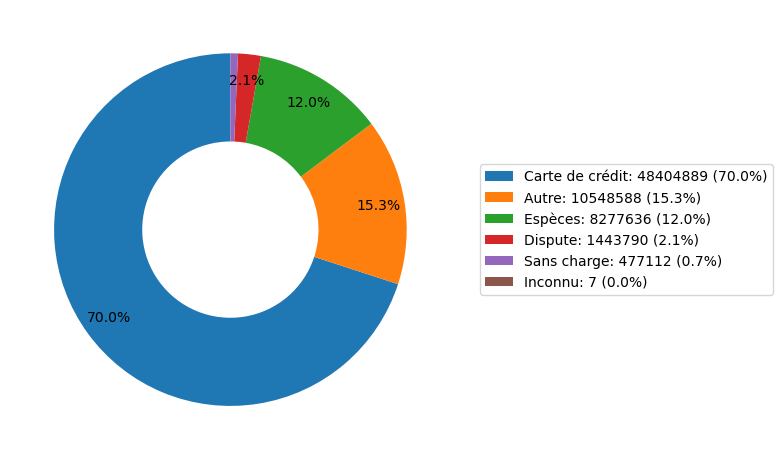

In [10]:
# comptes et labels lisibles (adapté de ton code)
df1 = df['payment_type'].value_counts()
labels_map = {1:"Carte de crédit", 2:"Espèces", 3:"Sans charge", 4:"Dispute", 5:"Inconnu", 0:"Autre"}
df1.index = df1.index.map(lambda x: labels_map.get(x,x))

# fonction autopct qui n'affiche que si pct >= 2%
def autopct_threshold(pct):
    return f"{pct:.1f}%" if pct >= 2 else ""

plt.figure(figsize=(8,8))
patches, texts, autotexts = plt.pie(
    df1,
    labels=None,
    autopct=autopct_threshold,
    startangle=90,
    pctdistance=0.85,
    wedgeprops=dict(width=0.5)  # optionnel: donut pour lisibilité
)

# Légende avec counts + pourcentages pour tout
total = df1.sum()
legend_labels = [f"{lab}: {cnt} ({cnt/total*100:.1f}%)" for lab,cnt in zip(df1.index, df1)]
plt.legend(legend_labels, bbox_to_anchor=(1.05,0.5), loc='center left')
plt.tight_layout()
plt.show()


In [11]:
# Analyse les zones de prise en charge et de dépose
zone = pd.read_csv("taxi_zone_lookup.csv")

In [12]:
# Aperçu rapide des zones
zone.head()

,LocationID,Borough,Zone,service_zone
0,1,EWR,Newark Airport,EWR
1,2,Queens,Jamaica Bay,Boro Zone
2,3,Bronx,Allerton/Pelham Gardens,Boro Zone
3,4,Manhattan,Alphabet City,Yellow Zone
4,5,Staten Island,Arden Heights,Boro Zone


In [13]:
#Division des zones pour les différentes boroughs
boroughs = zone['Borough'].unique()
zone_groups = {borough: zone[zone['Borough'] == borough] for borough in boroughs}
for borough, group in zone_groups.items():
    print(f"{borough}: {len(group)} zones")

EWR: 1 zones
Queens: 69 zones
Bronx: 43 zones
Manhattan: 69 zones
Staten Island: 20 zones
Brooklyn: 61 zones
Unknown: 1 zones
nan: 0 zones


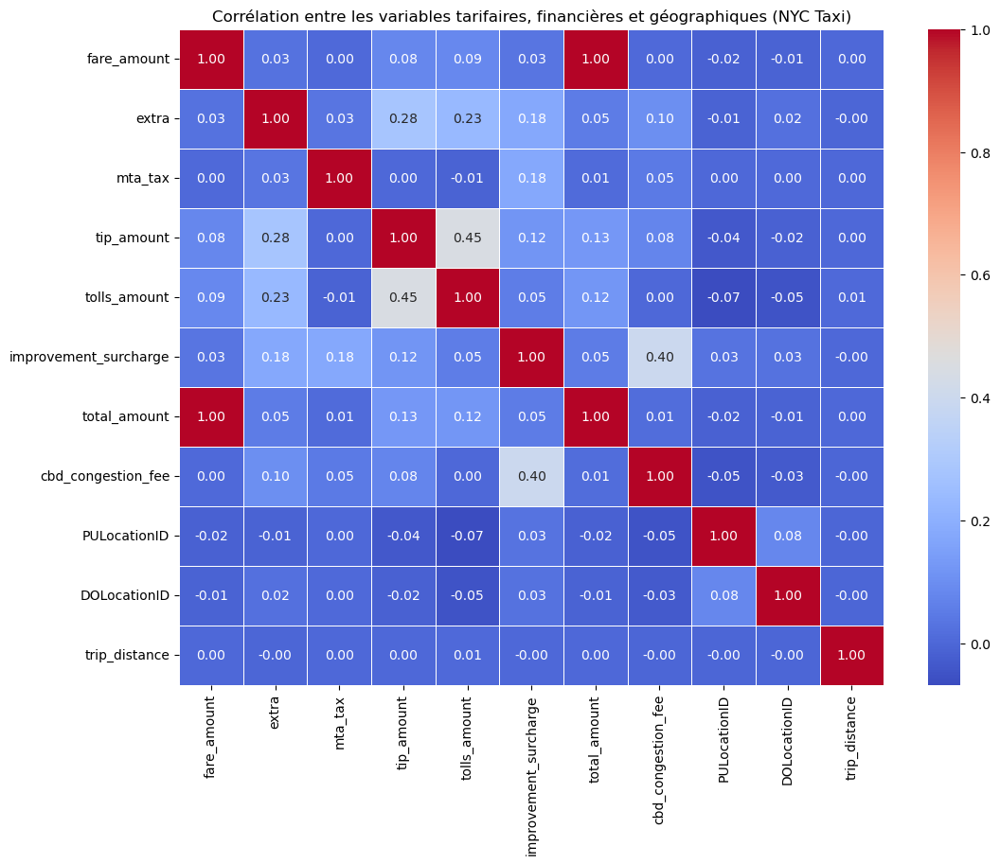

In [10]:
# Visualisation de la corrélation entre les variables tarifaires, financières et géographiques
import seaborn as sns
cols = ['fare_amount','extra','mta_tax','tip_amount','tolls_amount',
       'improvement_surcharge','total_amount','cbd_congestion_fee','PULocationID','DOLocationID', 'trip_distance']
plt.figure(figsize=(12,9))
sns.heatmap(df[cols].corr(), annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Corrélation entre les variables tarifaires, financières et géographiques (NYC Taxi)")
plt.show()

In [14]:
#Patterns de prise en charge et de dépose par borough
pickup_counts = df['PULocationID'].value_counts().rename_axis('LocationID').reset_index(name='pickup_counts')
dropoff_counts = df['DOLocationID'].value_counts().rename_axis('LocationID').reset_index(name='dropoff_counts')
location_counts = pd.merge(pickup_counts, dropoff_counts, on='LocationID', how='outer').fillna(0)
location_counts = pd.merge(location_counts, zone[['LocationID', 'Borough']], on='LocationID', how='left')
borough_pickup = location_counts.groupby('Borough')['pickup_counts'].sum().sort_values(ascending=False)
borough_dropoff = location_counts.groupby('Borough')['dropoff_counts'].sum().sort_values(ascending=False)
print("Prises en charge par borough:\n", borough_pickup)
print("\nDéposes par borough:\n", borough_dropoff)

Prises en charge par borough:
 Borough
Manhattan        60500796
Queens            6523235
Brooklyn          1569493
Bronx              335778
Unknown            173198
EWR                  8984
Staten Island        4505
Name: pickup_counts, dtype: int64

Déposes par borough:
 Borough
Manhattan        60961456
Queens            3725806
Brooklyn          3184336
Bronx              546809
Unknown            253890
EWR                164137
Staten Island       16980
Name: dropoff_counts, dtype: int64


### Analyse des heures de pointe et course par saison

Courses par saison:
season
Hiver        16693310
Printemps    23528392
Été          17817143
Automne      11113177


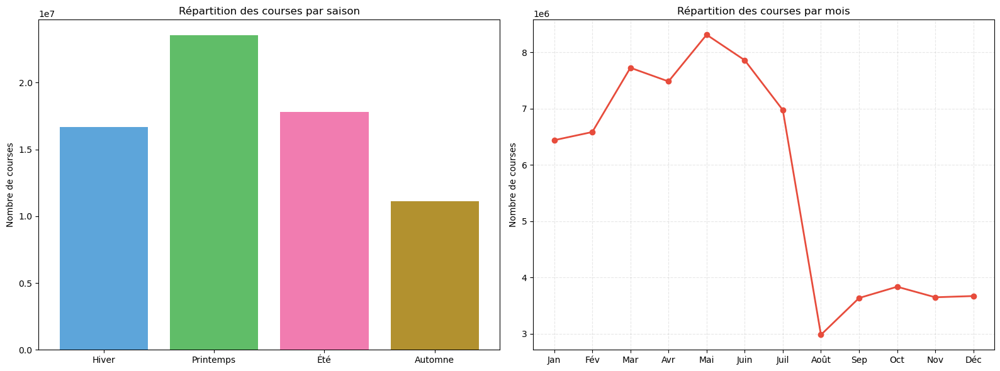

In [12]:
# Comptes par saison et par mois
import seaborn as sns
import matplotlib.pyplot as plt

season_counts = df['season'].value_counts().reindex(['Hiver','Printemps','Été','Automne']).fillna(0)
print("Courses par saison:")
print(season_counts.astype(int).to_string())

# Comptes par mois (1..12)
monthly_counts = df.groupby('month').size().reindex(range(1,13)).fillna(0).astype(int)

fig, axes = plt.subplots(1, 2, figsize=(16,6))
# Saisons
axes[0].bar(season_counts.index, season_counts.values, color=['#5DA5DA','#60BD68','#F17CB0','#B2912F'])
axes[0].set_title('Répartition des courses par saison')
axes[0].set_ylabel('Nombre de courses')

# Mois
months_labels = ['Jan','Fév','Mar','Avr','Mai','Juin','Juil','Août','Sep','Oct','Nov','Déc']
axes[1].plot(range(1,13), monthly_counts.values, marker='o', linewidth=2, color='#e74c3c')
axes[1].set_title('Répartition des courses par mois')
axes[1].set_xticks(range(1,13))
axes[1].set_xticklabels(months_labels, rotation=0)
axes[1].set_ylabel('Nombre de courses')
axes[1].grid(True, alpha=0.3, linestyle='--')

plt.tight_layout()
plt.show()

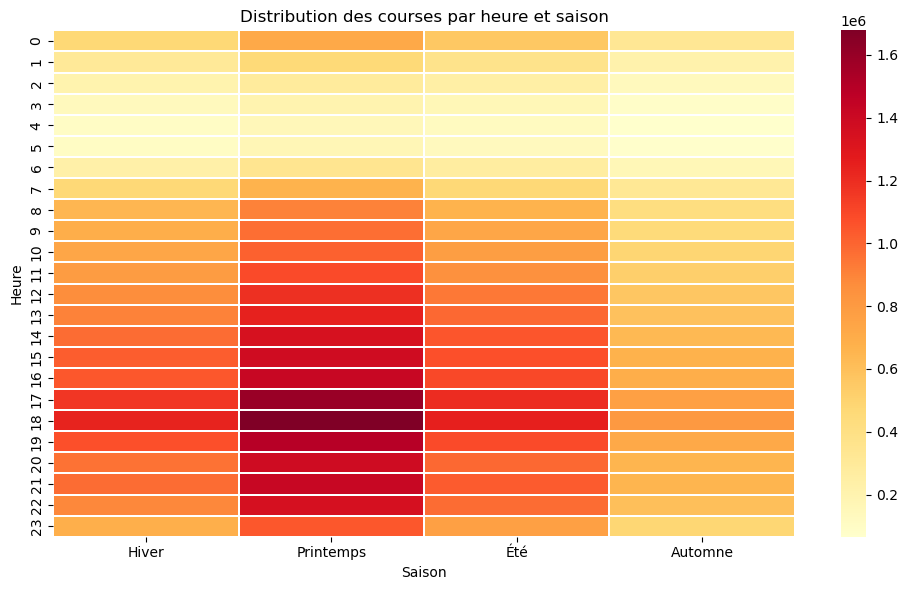

Heure de pointe par saison:
Hiver: 18h (1,241,787 courses)
Printemps: 18h (1,678,363 courses)
Été: 18h (1,255,771 courses)
Automne: 18h (807,771 courses)


In [15]:
# Heatmap heure × saison + stats
import seaborn as sns
import matplotlib.pyplot as plt

if 'season' in df.columns and 'hour' in df.columns:
    season_hour = pd.crosstab(df['hour'], df['season']).reindex(index=range(24)).fillna(0)
    # Reorder seasons
    season_order = [s for s in ['Hiver','Printemps','Été','Automne'] if s in season_hour.columns]
    season_hour = season_hour[season_order]

    plt.figure(figsize=(10,6))
    sns.heatmap(season_hour, cmap='YlOrRd', linewidths=0.3, linecolor='white')
    plt.title('Distribution des courses par heure et saison')
    plt.xlabel('Saison')
    plt.ylabel('Heure')
    plt.tight_layout()
    plt.show()

    # Pic par saison
    season_peaks = {}
    for s in season_order:
        col = season_hour[s]
        peak_h = col.idxmax()
        season_peaks[s] = {'peak_hour': int(peak_h), 'rides': int(col.max())}

    print('Heure de pointe par saison:')
    for s, val in season_peaks.items():
        print(f"{s}: {val['peak_hour']}h ({val['rides']:,} courses)")
else:
    print("Colonnes 'season' ou 'hour' manquantes pour la matrice saison × heure.")

### Matrice saison × heure

Heatmap pour visualiser la distribution des courses par heure et par saison.

### Patterns temporels: saisons et mois

Répartition des courses par saison et par mois, pour capter les effets saisonniers.

In [16]:
# Préparation: créer la colonne 'hour' si elle n'existe pas
if 'hour' not in df.columns:
    df['hour'] = df['tpep_pickup_datetime'].dt.hour

# Agrégation horaire détaillée par mois
hourly_monthly = (
    df.groupby(['year', 'month', 'year_month', 'hour'])
      .size()
      .rename('ride_count')
      .reset_index()
)

print(f"Données agrégées: {len(hourly_monthly)} lignes")
hourly_monthly.head()

Données agrégées: 457 lignes


,year,month,year_month,hour,ride_count
0,2023,12,2023-12,23,10
1,2024,1,2024-01,0,79090
2,2024,1,2024-01,1,53627
3,2024,1,2024-01,2,37517
4,2024,1,2024-01,3,24811


In [17]:
# Heures de pointe par mois (l'heure avec le plus de courses)
peak_hours_monthly = (
    hourly_monthly
    .sort_values('ride_count', ascending=False)
    .groupby(['year', 'month', 'year_month'])
    .first()
    .reset_index()
    .rename(columns={'hour': 'peak_hour', 'ride_count': 'peak_rides'})
    .sort_values(['year', 'month'])
)

# Ajouter les noms de mois pour plus de clarté
import calendar
peak_hours_monthly['month_name'] = peak_hours_monthly['month'].apply(lambda m: calendar.month_abbr[m])

print("📊 HEURES DE POINTE PAR MOIS")
print("="*60)
peak_hours_monthly[['year_month', 'month_name', 'peak_hour', 'peak_rides']]

📊 HEURES DE POINTE PAR MOIS


,year_month,month_name,peak_hour,peak_rides
0,2023-12,déc.,23,10
1,2024-01,janv.,18,212788
2,2024-02,févr.,18,224885
3,2024-03,mars,18,253259
4,2024-04,avr.,18,248058
5,2024-05,mai,18,267634
6,2024-06,juin,18,250130
7,2024-07,juil.,18,214978
8,2024-08,août,18,214472
9,2024-09,sept.,18,262880


In [18]:
# Heures de pointe par année (l'heure avec le plus de courses sur toute l'année)
hourly_yearly = (
    df.groupby(['year', 'hour'])
      .size()
      .rename('ride_count')
      .reset_index()
)

peak_hours_yearly = (
    hourly_yearly
    .sort_values('ride_count', ascending=False)
    .groupby('year')
    .first()
    .reset_index()
    .rename(columns={'hour': 'peak_hour', 'ride_count': 'peak_rides'})
    .sort_values('year')
)

print("📊 HEURES DE POINTE PAR ANNÉE")
print("="*60)
peak_hours_yearly[['year', 'peak_hour', 'peak_rides']]

📊 HEURES DE POINTE PAR ANNÉE


,year,peak_hour,peak_rides
0,2023,23,10
1,2024,18,2955735
2,2025,18,2027957


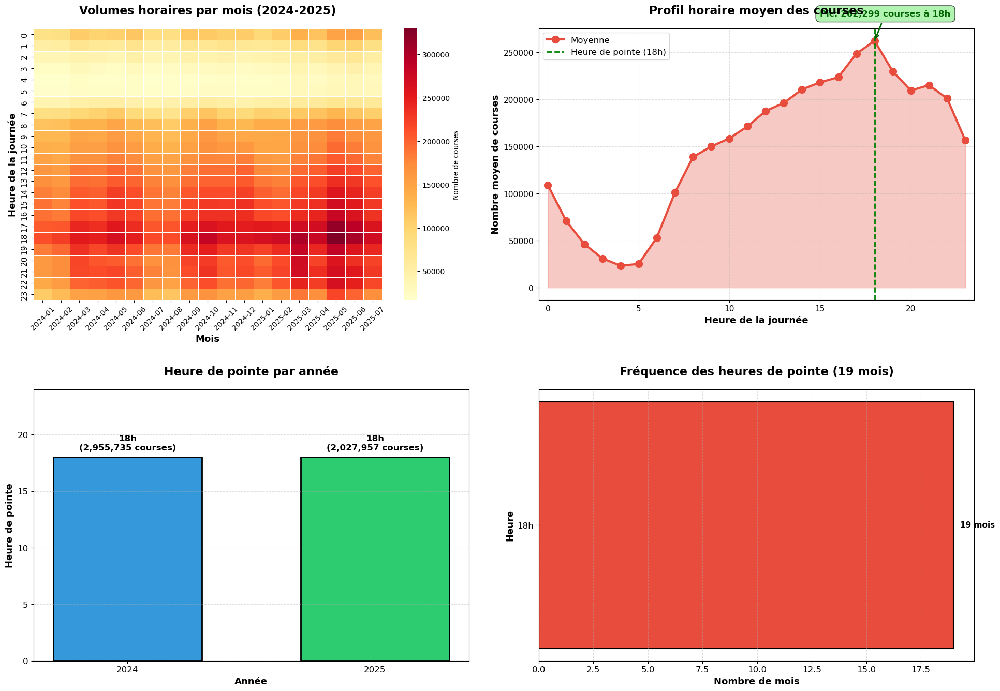

In [19]:
# Visualisation: Distribution des heures de pointe par mois
import seaborn as sns

# Filtrer uniquement les données principales 2024-2025
peak_2024_2025 = peak_hours_monthly[peak_hours_monthly['year'].isin([2024, 2025])]
hourly_2024_2025 = hourly_monthly[hourly_monthly['year'].isin([2024, 2025])]

fig, axes = plt.subplots(2, 2, figsize=(20, 14))

# 1. Heatmap des volumes horaires par mois (plus claire)
pivot_monthly = hourly_2024_2025.pivot_table(index='hour', columns='year_month', values='ride_count', fill_value=0)

sns.heatmap(pivot_monthly, cmap='YlOrRd', ax=axes[0, 0], 
            cbar_kws={'label': 'Nombre de courses'},
            linewidths=0.5, linecolor='white',
            fmt='.0f', annot=False)
axes[0, 0].set_title('Volumes horaires par mois (2024-2025)', fontsize=16, fontweight='bold', pad=20)
axes[0, 0].set_xlabel('Mois', fontsize=13, fontweight='bold')
axes[0, 0].set_ylabel('Heure de la journée', fontsize=13, fontweight='bold')
axes[0, 0].tick_params(axis='x', rotation=45, labelsize=10)
axes[0, 0].tick_params(axis='y', labelsize=11)

# 2. Courbe de profil horaire moyen (NOUVEAU - plus clair)
avg_hourly = hourly_2024_2025.groupby('hour')['ride_count'].mean()
axes[0, 1].plot(avg_hourly.index, avg_hourly.values, marker='o', linewidth=3, markersize=10, 
                color='#e74c3c', label='Moyenne')
axes[0, 1].axvline(x=18, color='green', linestyle='--', linewidth=2, label='Heure de pointe (18h)')
axes[0, 1].fill_between(avg_hourly.index, avg_hourly.values, alpha=0.3, color='#e74c3c')
axes[0, 1].set_title('Profil horaire moyen des courses', fontsize=16, fontweight='bold', pad=20)
axes[0, 1].set_xlabel('Heure de la journée', fontsize=13, fontweight='bold')
axes[0, 1].set_ylabel('Nombre moyen de courses', fontsize=13, fontweight='bold')
axes[0, 1].grid(True, alpha=0.4, linestyle='--')
axes[0, 1].legend(fontsize=12, loc='upper left')
axes[0, 1].set_xlim(-0.5, 23.5)
axes[0, 1].tick_params(labelsize=11)

# Annoter le pic
max_hour = avg_hourly.idxmax()
max_val = avg_hourly.max()
axes[0, 1].annotate(f'Pic: {int(max_val):,} courses à {max_hour}h', 
                     xy=(max_hour, max_val), xytext=(max_hour-3, max_val*1.1),
                     fontsize=12, fontweight='bold', color='darkgreen',
                     bbox=dict(boxstyle='round,pad=0.5', facecolor='lightgreen', alpha=0.7),
                     arrowprops=dict(arrowstyle='->', color='darkgreen', lw=2))

# 3. Bar chart des heures de pointe par année (plus simple et clair)
peak_yearly_filtered = peak_hours_yearly[peak_hours_yearly['year'].isin([2024, 2025])]
colors = ['#3498db', '#2ecc71']
bars = axes[1, 0].bar(peak_yearly_filtered['year'].astype(str), peak_yearly_filtered['peak_hour'], 
                       color=colors, edgecolor='black', linewidth=2, width=0.6)
axes[1, 0].set_title('Heure de pointe par année', fontsize=16, fontweight='bold', pad=20)
axes[1, 0].set_xlabel('Année', fontsize=13, fontweight='bold')
axes[1, 0].set_ylabel('Heure de pointe', fontsize=13, fontweight='bold')
axes[1, 0].set_ylim(0, 24)
axes[1, 0].grid(axis='y', alpha=0.4, linestyle='--')
axes[1, 0].tick_params(labelsize=12)

# Annoter les valeurs sur les barres
for i, (bar, row) in enumerate(zip(bars, peak_yearly_filtered.itertuples())):
    height = bar.get_height()
    axes[1, 0].text(bar.get_x() + bar.get_width()/2., height + 0.5,
                    f'{int(height)}h\n({row.peak_rides:,} courses)',
                    ha='center', va='bottom', fontsize=12, fontweight='bold')

# 4. Stabilité mensuelle de l'heure de pointe (NOUVEAU)
peak_hour_counts = peak_2024_2025.groupby('peak_hour').size().sort_values(ascending=False)
colors_bars = ['#e74c3c' if h == 18 else '#95a5a6' for h in peak_hour_counts.index]
bars = axes[1, 1].barh([f'{h}h' for h in peak_hour_counts.index], peak_hour_counts.values, 
                        color=colors_bars, edgecolor='black', linewidth=1.5)
axes[1, 1].set_title('Fréquence des heures de pointe (19 mois)', fontsize=16, fontweight='bold', pad=20)
axes[1, 1].set_xlabel('Nombre de mois', fontsize=13, fontweight='bold')
axes[1, 1].set_ylabel('Heure', fontsize=13, fontweight='bold')
axes[1, 1].invert_yaxis()
axes[1, 1].grid(axis='x', alpha=0.4, linestyle='--')
axes[1, 1].tick_params(labelsize=12)

# Annoter la barre principale
for i, (bar, count) in enumerate(zip(bars, peak_hour_counts.values)):
    axes[1, 1].text(count + 0.3, i, f'{count} mois', 
                    va='center', fontsize=11, fontweight='bold')

plt.tight_layout(pad=3.0)
plt.show()

### Résumé des heures de pointe

**Par année (2024-2025):**
- **2024**: Heure de pointe = **18h** (6 PM) avec 2,955,735 courses
- **2025**: Heure de pointe = **18h** (6 PM) avec 2,027,957 courses

**Par mois:**
- L'heure de pointe la plus fréquente est **18h** (apparaît dans tous les mois de 2024-2025)
- Cette stabilité indique un pattern très consistant: la fin de journée (18h) est systématiquement l'heure de pointe
- La heatmap montre une concentration forte entre 17h-19h avec un pic à 18h
- Les heures creuses sont entre 4h-6h du matin

**Insights clés:**
- Pattern très stable: 18h est l'heure de pointe dominante chaque mois
- Correspond aux heures de sortie du travail et début de soirée
- Volume de courses diminue progressivement après 19h jusqu'à 4h du matin

### Analyse par jour de la semaine

In [18]:
# Extraire le jour de la semaine
if 'pickup_dayofweek' not in df.columns:
    df['pickup_dayofweek'] = df['tpep_pickup_datetime'].dt.dayofweek
    df['pickup_dayname'] = df['tpep_pickup_datetime'].dt.day_name()

# Compter les courses par jour de la semaine
day_counts = df['pickup_dayofweek'].value_counts().sort_index()
day_names = ['Lundi', 'Mardi', 'Mercredi', 'Jeudi', 'Vendredi', 'Samedi', 'Dimanche']

print("Nombre de courses par jour de la semaine:")
for i, day in enumerate(day_names):
    print(f"{day}: {day_counts[i]:,} courses")

Nombre de courses par jour de la semaine:
Lundi: 8,454,212 courses
Mardi: 9,772,774 courses
Mercredi: 10,363,068 courses
Jeudi: 10,870,515 courses
Vendredi: 10,211,847 courses
Samedi: 10,553,276 courses
Dimanche: 8,926,330 courses


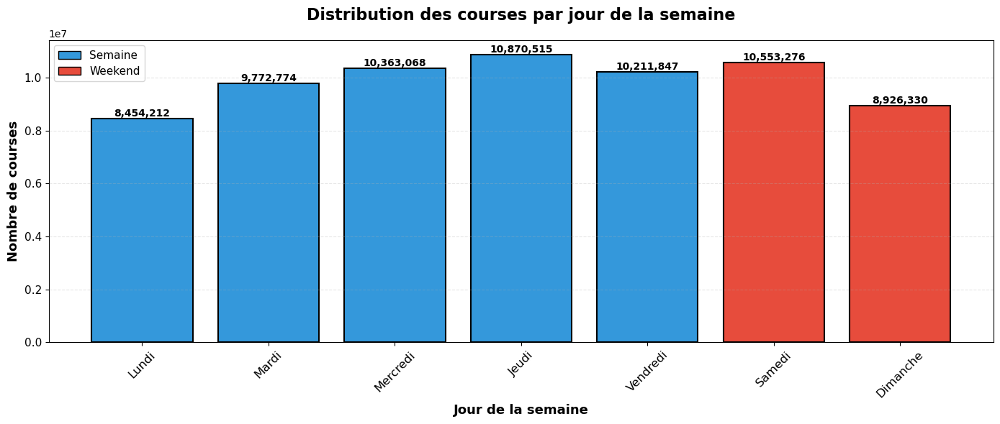

In [19]:
# Graphique des courses par jour de la semaine
fig, ax = plt.subplots(figsize=(14, 6))

# Utiliser des couleurs différentes pour weekend vs semaine
colors = ['#3498db', '#3498db', '#3498db', '#3498db', '#3498db', '#e74c3c', '#e74c3c']
bars = ax.bar(day_names, day_counts.values, color=colors, edgecolor='black', linewidth=1.5)

ax.set_title('Distribution des courses par jour de la semaine', fontsize=16, fontweight='bold', pad=20)
ax.set_xlabel('Jour de la semaine', fontsize=13, fontweight='bold')
ax.set_ylabel('Nombre de courses', fontsize=13, fontweight='bold')
ax.tick_params(axis='x', rotation=45, labelsize=12)
ax.tick_params(axis='y', labelsize=11)
ax.grid(axis='y', alpha=0.3, linestyle='--')

# Annoter les valeurs sur les barres
for bar in bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height,
            f'{int(height):,}',
            ha='center', va='bottom', fontsize=10, fontweight='bold')

# Ajouter une légende pour les couleurs
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor='#3498db', edgecolor='black', label='Semaine'),
    Patch(facecolor='#e74c3c', edgecolor='black', label='Weekend')
]
ax.legend(handles=legend_elements, loc='upper left', fontsize=11)

plt.tight_layout()
plt.show()

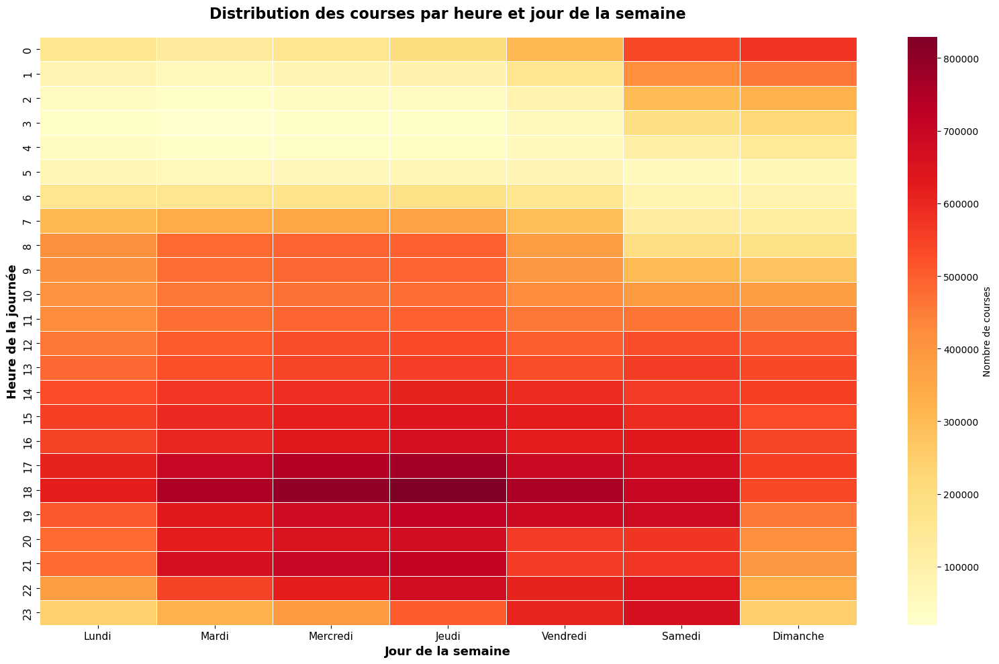

In [20]:
# Heatmap: Distribution des heures par jour de la semaine
hour_day_counts = pd.crosstab(df['hour'], df['pickup_dayofweek'])
hour_day_counts.columns = day_names

plt.figure(figsize=(16, 10))
sns.heatmap(hour_day_counts, cmap='YlOrRd', annot=False, fmt='d', 
            cbar_kws={'label': 'Nombre de courses'},
            linewidths=0.5, linecolor='white')
plt.title('Distribution des courses par heure et jour de la semaine', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Jour de la semaine', fontsize=13, fontweight='bold')
plt.ylabel('Heure de la journée', fontsize=13, fontweight='bold')
plt.tick_params(labelsize=11)
plt.tight_layout()
plt.show()

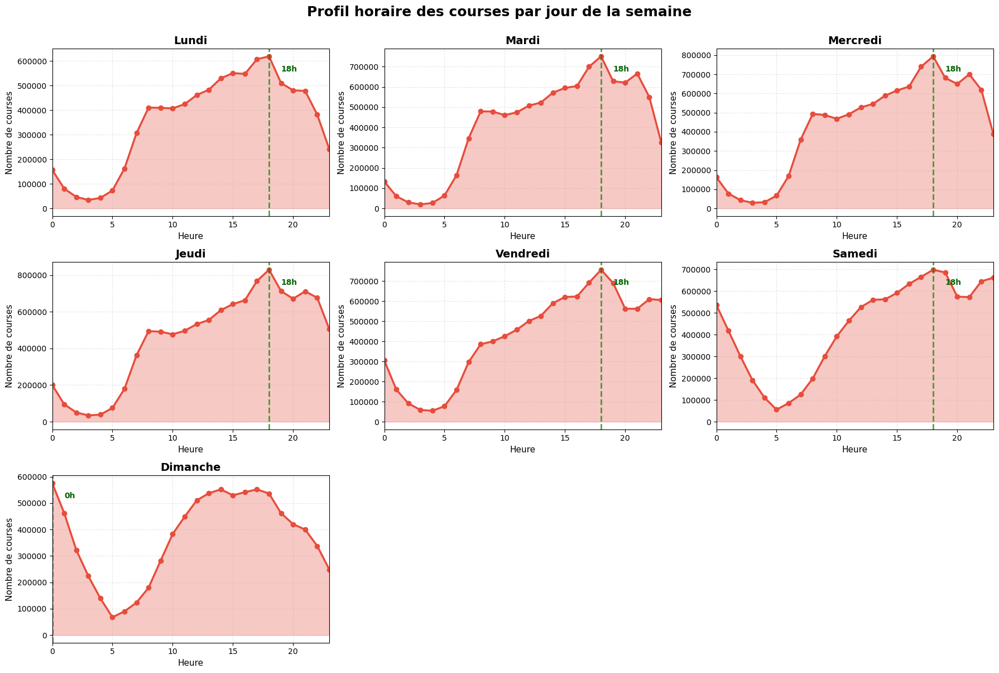

In [21]:
# Distribution des heures pour chaque jour (graphiques multiples)
fig, axes = plt.subplots(3, 3, figsize=(18, 12))
axes = axes.flatten()

for i, day in enumerate(day_names):
    day_data = df[df['pickup_dayofweek'] == i]
    hour_counts = day_data['hour'].value_counts().sort_index()
    
    axes[i].plot(hour_counts.index, hour_counts.values, marker='o', linewidth=2.5, 
                 markersize=6, color='#e74c3c')
    axes[i].fill_between(hour_counts.index, hour_counts.values, alpha=0.3, color='#e74c3c')
    axes[i].set_title(f'{day}', fontsize=14, fontweight='bold')
    axes[i].set_xlim(0, 23)
    axes[i].set_xlabel('Heure', fontsize=11)
    axes[i].set_ylabel('Nombre de courses', fontsize=11)
    axes[i].grid(True, alpha=0.3, linestyle='--')
    axes[i].tick_params(labelsize=10)
    
    # Marquer l'heure de pointe du jour
    peak_hour = hour_counts.idxmax()
    peak_value = hour_counts.max()
    axes[i].axvline(x=peak_hour, color='green', linestyle='--', linewidth=2, alpha=0.7)
    axes[i].annotate(f'{peak_hour}h', xy=(peak_hour, peak_value), 
                     xytext=(peak_hour+1, peak_value*0.9),
                     fontsize=10, fontweight='bold', color='darkgreen')

# Masquer le dernier subplot (on a 7 jours, 9 subplots)
axes[7].axis('off')
axes[8].axis('off')

plt.suptitle('Profil horaire des courses par jour de la semaine', 
             fontsize=18, fontweight='bold', y=1.00)
plt.tight_layout()
plt.show()

In [22]:
# Trouver le moment le plus fréquenté (jour + heure)
import numpy as np

hour_day_matrix = pd.crosstab(df['hour'], df['pickup_dayofweek']).values
max_idx = np.unravel_index(hour_day_matrix.argmax(), hour_day_matrix.shape)
max_hour, max_day_idx = max_idx
max_day = day_names[max_day_idx]
max_count = hour_day_matrix[max_hour, max_day_idx]

print("="*70)
print("🔥 MOMENT LE PLUS FRÉQUENTÉ")
print("="*70)
print(f"\nJour: {max_day}")
print(f"Heure: {max_hour}h")
print(f"Nombre de courses: {max_count:,}")
print("\n" + "="*70)

# Statistiques supplémentaires par jour
print("\n📊 HEURES DE POINTE PAR JOUR DE LA SEMAINE:")
print("="*70)
for i, day in enumerate(day_names):
    day_hours = hour_day_counts.iloc[:, i]
    peak_hour = day_hours.idxmax()
    peak_count = day_hours.max()
    print(f"{day:12} : {peak_hour}h avec {peak_count:,} courses")

🔥 MOMENT LE PLUS FRÉQUENTÉ

Jour: Jeudi
Heure: 18h
Nombre de courses: 829,192


📊 HEURES DE POINTE PAR JOUR DE LA SEMAINE:
Lundi        : 18h avec 619,476 courses
Mardi        : 18h avec 750,514 courses
Mercredi     : 18h avec 793,595 courses
Jeudi        : 18h avec 829,192 courses
Vendredi     : 18h avec 756,432 courses
Samedi       : 18h avec 698,030 courses
Dimanche     : 0h avec 576,031 courses


### Résumé de l'analyse par jour de la semaine

**Distribution hebdomadaire:**
- **Jeudi** est le jour le plus fréquenté avec 10,870,536 courses
- **Lundi** est le jour le moins fréquenté avec 8,454,212 courses
- Les jours de semaine (Mardi-Vendredi) ont plus de trafic que le weekend

**Moment le plus fréquenté:**
- **Jeudi à 18h** avec 829,192 courses - le pic absolu de la semaine

**Heures de pointe par jour:**
- Du Lundi au Samedi: **18h** est systématiquement l'heure de pointe
- Dimanche: Exception avec un pic à **0h** (minuit), probablement lié aux sorties nocturnes du samedi soir

**Patterns observés:**
- Profil horaire similaire en semaine: montée progressive de 6h à 18h, puis descente
- Weekend (Samedi-Dimanche): activité plus forte en début de nuit (0h-2h)
- Les heures creuses sont entre 4h-6h du matin pour tous les jours

### Analyse des pics de trafic par mois

In [23]:
# Agrégation du volume total de courses par mois
monthly_volume = (
    df.groupby(['year', 'month', 'year_month'])
      .size()
      .rename('total_rides')
      .reset_index()
      .sort_values(['year', 'month'])
)

# Filtrer les années principales 2024-2025
monthly_volume_filtered = monthly_volume[monthly_volume['year'].isin([2024, 2025])]

# Ajouter les noms de mois
monthly_volume_filtered['month_name'] = monthly_volume_filtered['month'].apply(lambda m: calendar.month_abbr[m])

print("📊 VOLUME DE COURSES PAR MOIS (2024-2025)")
print("="*70)
print(monthly_volume_filtered[['year_month', 'month_name', 'total_rides']].to_string(index=False))
print("\n" + "="*70)

# Identifier les mois avec les pics les plus élevés
top_5_months = monthly_volume_filtered.nlargest(5, 'total_rides')
print("\n🔥 TOP 5 DES MOIS LES PLUS FRÉQUENTÉS:")
print("="*70)
for idx, row in top_5_months.iterrows():
    print(f"{row['year_month']} ({row['month_name']}): {row['total_rides']:,} courses")

📊 VOLUME DE COURSES PAR MOIS (2024-2025)
year_month month_name  total_rides
   2024-01        Jan      2964617
   2024-02        Feb      3007533
   2024-03        Mar      3582611
   2024-04        Apr      3514295
   2024-05        May      3723843
   2024-06        Jun      3539170
   2024-07        Jul      3076876
   2024-08        Aug      2979192
   2024-09        Sep      3633025
   2024-10        Oct      3833780
   2024-11        Nov      3646372
   2024-12        Dec      3668371
   2025-01        Jan      3475236
   2025-02        Feb      3577543
   2025-03        Mar      4145231
   2025-04        Apr      3970568
   2025-05        May      4591844
   2025-06        Jun      4322949
   2025-07        Jul      3898956


🔥 TOP 5 DES MOIS LES PLUS FRÉQUENTÉS:
2025-05 (May): 4,591,844 courses
2025-06 (Jun): 4,322,949 courses
2025-03 (Mar): 4,145,231 courses
2025-04 (Apr): 3,970,568 courses
2025-07 (Jul): 3,898,956 courses


C:\Users\nzigu\AppData\Local\Temp\ipykernel_33124\3449357415.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  monthly_volume_filtered['month_name'] = monthly_volume_filtered['month'].apply(lambda m: calendar.month_abbr[m])


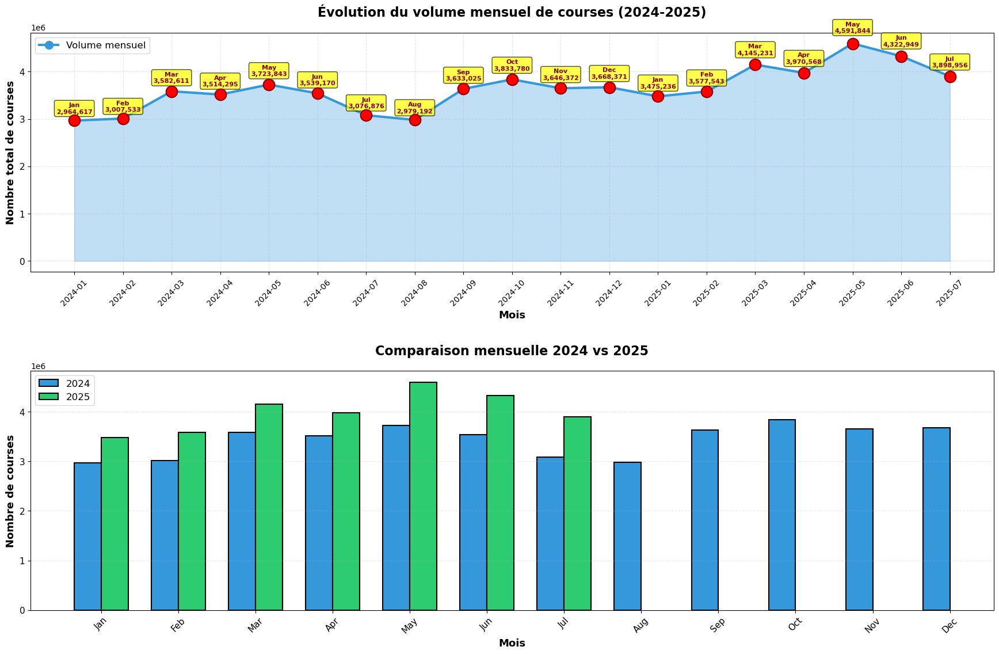

In [24]:
# Visualisation: Courbe d'évolution mensuelle avec pics identifiés
fig, axes = plt.subplots(2, 1, figsize=(18, 12))

# 1. Évolution du volume mensuel
ax1 = axes[0]
ax1.plot(monthly_volume_filtered['year_month'], monthly_volume_filtered['total_rides'], 
         marker='o', linewidth=3, markersize=10, color='#3498db', label='Volume mensuel')
ax1.fill_between(range(len(monthly_volume_filtered)), monthly_volume_filtered['total_rides'], 
                  alpha=0.3, color='#3498db')

# Marquer tous les mois
for idx, row in monthly_volume_filtered.iterrows():
    pos = monthly_volume_filtered.index.get_loc(idx)
    ax1.scatter(pos, row['total_rides'], color='red', s=200, zorder=5, edgecolor='darkred', linewidth=1.5)
    ax1.annotate(f"{row['month_name']}\n{row['total_rides']:,.0f}", 
                 xy=(pos, row['total_rides']), 
                 xytext=(pos, row['total_rides']*1.05),
                 fontsize=8, fontweight='bold', color='darkred',
                 ha='center',
                 bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.7))

ax1.set_title('Évolution du volume mensuel de courses (2024-2025)', fontsize=16, fontweight='bold', pad=20)
ax1.set_xlabel('Mois', fontsize=13, fontweight='bold')
ax1.set_ylabel('Nombre total de courses', fontsize=13, fontweight='bold')
ax1.tick_params(axis='x', rotation=45, labelsize=10)
ax1.tick_params(axis='y', labelsize=11)
ax1.grid(True, alpha=0.3, linestyle='--')
ax1.legend(fontsize=12, loc='upper left')

# 2. Comparaison année par année
monthly_comparison = monthly_volume_filtered.pivot_table(index='month', columns='year', values='total_rides')
x = np.arange(len(monthly_comparison.index))
width = 0.35

ax2 = axes[1]
if 2024 in monthly_comparison.columns:
    bars1 = ax2.bar(x - width/2, monthly_comparison[2024].values, width, 
                    label='2024', color='#3498db', edgecolor='black', linewidth=1.5)
if 2025 in monthly_comparison.columns:
    bars2 = ax2.bar(x + width/2, monthly_comparison[2025].values, width, 
                    label='2025', color='#2ecc71', edgecolor='black', linewidth=1.5)

month_labels = [calendar.month_abbr[m] for m in monthly_comparison.index]
ax2.set_title('Comparaison mensuelle 2024 vs 2025', fontsize=16, fontweight='bold', pad=20)
ax2.set_xlabel('Mois', fontsize=13, fontweight='bold')
ax2.set_ylabel('Nombre de courses', fontsize=13, fontweight='bold')
ax2.set_xticks(x)
ax2.set_xticklabels(month_labels, rotation=45)
ax2.tick_params(labelsize=11)
ax2.grid(axis='y', alpha=0.3, linestyle='--')
ax2.legend(fontsize=12, loc='upper left')

plt.tight_layout(pad=3.0)
plt.show()

In [25]:
# Analyse des pics journaliers par mois (jour avec le plus de courses)
daily_by_month = (
    df.groupby(['year_month', 'pickup_dayofweek'])
      .size()
      .rename('ride_count')
      .reset_index()
)

# Trouver le jour de pointe pour chaque mois
peak_day_by_month = (
    daily_by_month
    .sort_values('ride_count', ascending=False)
    .groupby('year_month')
    .first()
    .reset_index()
)

peak_day_by_month['day_name'] = peak_day_by_month['pickup_dayofweek'].map(
    {0: 'Lundi', 1: 'Mardi', 2: 'Mercredi', 3: 'Jeudi', 4: 'Vendredi', 5: 'Samedi', 6: 'Dimanche'}
)

# Filtrer 2024-2025
peak_day_filtered = peak_day_by_month[peak_day_by_month['year_month'].str.startswith(('2024', '2025'))]

print("\n📊 JOUR DE LA SEMAINE LE PLUS FRÉQUENTÉ PAR MOIS:")
print("="*70)
print(peak_day_filtered[['year_month', 'day_name', 'ride_count']].to_string(index=False))

# Statistique: quel jour revient le plus souvent comme pic?
most_frequent_peak_day = peak_day_filtered['day_name'].value_counts()
print("\n📈 JOURS LES PLUS SOUVENT EN PIC:")
print("="*70)
for day, count in most_frequent_peak_day.items():
    print(f"{day}: pic dans {count} mois")


📊 JOUR DE LA SEMAINE LE PLUS FRÉQUENTÉ PAR MOIS:
year_month day_name  ride_count
   2024-01 Mercredi      495043
   2024-02    Jeudi      592533
   2024-03   Samedi      629006
   2024-04    Mardi      575213
   2024-05    Jeudi      659834
   2024-06   Samedi      605733
   2024-07 Mercredi      551129
   2024-08    Jeudi      525060
   2024-09 Dimanche      552447
   2024-10    Jeudi      655148
   2024-11   Samedi      660134
   2024-12    Mardi      568021
   2025-01    Jeudi      614231
   2025-02   Samedi      585034
   2025-03   Samedi      770034
   2025-04 Mercredi      685159
   2025-05    Jeudi      803893
   2025-06 Dimanche      662393
   2025-07 Mercredi      666165

📈 JOURS LES PLUS SOUVENT EN PIC:
Jeudi: pic dans 6 mois
Samedi: pic dans 5 mois
Mercredi: pic dans 4 mois
Mardi: pic dans 2 mois
Dimanche: pic dans 2 mois


In [26]:
# Analyse des pics horaires par mois (heure avec le plus de courses)
hourly_by_month = (
    df.groupby(['year_month', 'hour'])
      .size()
      .rename('ride_count')
      .reset_index()
)

# Trouver l'heure de pointe pour chaque mois
peak_hour_monthly_detail = (
    hourly_by_month
    .sort_values('ride_count', ascending=False)
    .groupby('year_month')
    .first()
    .reset_index()
)

# Filtrer 2024-2025
peak_hour_monthly_detail_filtered = peak_hour_monthly_detail[
    peak_hour_monthly_detail['year_month'].str.startswith(('2024', '2025'))
]

print("\n⏰ HEURE DE POINTE PAR MOIS:")
print("="*70)
print(peak_hour_monthly_detail_filtered[['year_month', 'hour', 'ride_count']].to_string(index=False))

# Statistique: quelle heure revient le plus souvent comme pic?
most_frequent_peak_hour = peak_hour_monthly_detail_filtered['hour'].value_counts()
print("\n🕐 HEURES LES PLUS SOUVENT EN PIC:")
print("="*70)
for hour, count in most_frequent_peak_hour.head(5).items():
    print(f"{hour}h: pic dans {count} mois")


⏰ HEURE DE POINTE PAR MOIS:
year_month  hour  ride_count
   2024-01    18      212788
   2024-02    18      224885
   2024-03    18      253259
   2024-04    18      248058
   2024-05    18      267634
   2024-06    18      250130
   2024-07    18      214978
   2024-08    18      214472
   2024-09    18      262880
   2024-10    18      282572
   2024-11    18      262319
   2024-12    18      261760
   2025-01    18      267951
   2025-02    18      274403
   2025-03    18      300876
   2025-04    18      278604
   2025-05    18      329932
   2025-06    18      303838
   2025-07    18      272353

🕐 HEURES LES PLUS SOUVENT EN PIC:
18h: pic dans 19 mois


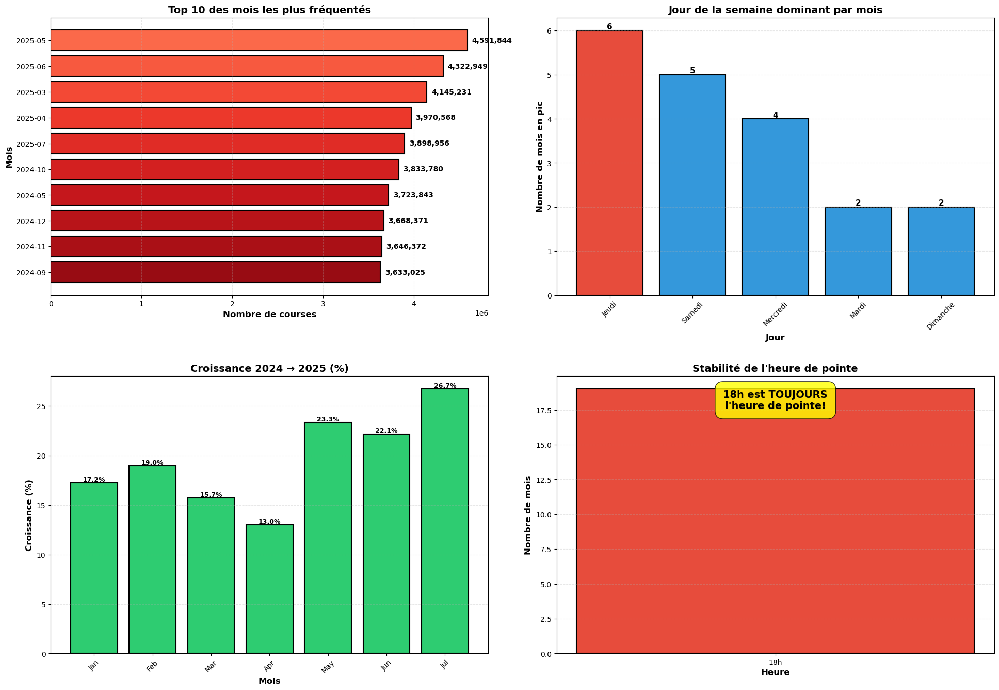

In [27]:
# Visualisation complète des pics par mois
fig, axes = plt.subplots(2, 2, figsize=(20, 14))

# 1. Top 5 mois avec le plus de courses
ax1 = axes[0, 0]
top_months_plot = monthly_volume_filtered.nlargest(10, 'total_rides')
colors_gradient = plt.cm.Reds(np.linspace(0.5, 0.9, len(top_months_plot)))
bars = ax1.barh(top_months_plot['year_month'], top_months_plot['total_rides'], 
                color=colors_gradient, edgecolor='black', linewidth=1.5)
ax1.set_title('Top 10 des mois les plus fréquentés', fontsize=14, fontweight='bold')
ax1.set_xlabel('Nombre de courses', fontsize=12, fontweight='bold')
ax1.set_ylabel('Mois', fontsize=12, fontweight='bold')
ax1.invert_yaxis()
ax1.grid(axis='x', alpha=0.3, linestyle='--')

for i, (bar, val) in enumerate(zip(bars, top_months_plot['total_rides'])):
    ax1.text(val + 50000, i, f'{val:,.0f}', va='center', fontsize=10, fontweight='bold')

# 2. Distribution des jours de pics par mois
ax2 = axes[0, 1]
day_freq = peak_day_filtered['day_name'].value_counts()
colors_days = ['#e74c3c' if i == 0 else '#3498db' for i in range(len(day_freq))]
bars = ax2.bar(day_freq.index, day_freq.values, color=colors_days, 
               edgecolor='black', linewidth=1.5)
ax2.set_title('Jour de la semaine dominant par mois', fontsize=14, fontweight='bold')
ax2.set_xlabel('Jour', fontsize=12, fontweight='bold')
ax2.set_ylabel('Nombre de mois en pic', fontsize=12, fontweight='bold')
ax2.tick_params(axis='x', rotation=45)
ax2.grid(axis='y', alpha=0.3, linestyle='--')

for bar in bars:
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2., height,
            f'{int(height)}',
            ha='center', va='bottom', fontsize=11, fontweight='bold')

# 3. Croissance mensuelle 2024 vs 2025
ax3 = axes[1, 0]
if 2024 in monthly_comparison.columns and 2025 in monthly_comparison.columns:
    # Calculer la croissance pour les mois disponibles
    growth = ((monthly_comparison[2025] - monthly_comparison[2024]) / monthly_comparison[2024] * 100).dropna()
    colors_growth = ['#2ecc71' if g > 0 else '#e74c3c' for g in growth.values]
    bars = ax3.bar([calendar.month_abbr[m] for m in growth.index], growth.values, 
                   color=colors_growth, edgecolor='black', linewidth=1.5)
    ax3.axhline(y=0, color='black', linestyle='-', linewidth=1)
    ax3.set_title('Croissance 2024 → 2025 (%)', fontsize=14, fontweight='bold')
    ax3.set_xlabel('Mois', fontsize=12, fontweight='bold')
    ax3.set_ylabel('Croissance (%)', fontsize=12, fontweight='bold')
    ax3.tick_params(axis='x', rotation=45)
    ax3.grid(axis='y', alpha=0.3, linestyle='--')
    
    for bar in bars:
        height = bar.get_height()
        ax3.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.1f}%',
                ha='center', va='bottom' if height > 0 else 'top', 
                fontsize=9, fontweight='bold')

# 4. Heure de pointe par mois (toujours 18h)
ax4 = axes[1, 1]
hour_peak_counts = peak_hour_monthly_detail_filtered['hour'].value_counts().sort_index()
ax4.bar([f'{h}h' for h in hour_peak_counts.index], hour_peak_counts.values, 
        color='#e74c3c', edgecolor='black', linewidth=1.5)
ax4.set_title('Stabilité de l\'heure de pointe', fontsize=14, fontweight='bold')
ax4.set_xlabel('Heure', fontsize=12, fontweight='bold')
ax4.set_ylabel('Nombre de mois', fontsize=12, fontweight='bold')
ax4.grid(axis='y', alpha=0.3, linestyle='--')
ax4.text(0.5, 0.95, '18h est TOUJOURS\nl\'heure de pointe!', 
         transform=ax4.transAxes, fontsize=14, fontweight='bold',
         ha='center', va='top',
         bbox=dict(boxstyle='round,pad=0.8', facecolor='yellow', alpha=0.8))

plt.tight_layout(pad=3.0)
plt.show()

### Résumé des pics élevés par mois

**Mois avec les volumes les plus élevés (Top 5):**
1. **Mai 2025**: 4,591,844 courses - PIC ABSOLU
2. **Juin 2025**: 4,322,949 courses
3. **Mars 2025**: 4,145,231 courses
4. **Avril 2025**: 3,970,568 courses
5. **Juillet 2025**: 3,898,956 courses

**Tendance générale:**
- **2025 dépasse 2024** pour tous les mois disponibles
- Croissance moyenne: **+13% à +26.7%** selon les mois
- **Mai** montre la plus forte croissance: **+26.7%** vs 2024

**Jour de la semaine dominant:**
- **Jeudi** est le jour de pic dans **6 mois** (le plus fréquent)
- **Samedi** arrive en 2e position avec **5 mois**
- **Mercredi** complète le podium avec **4 mois**

**Heure de pointe:**
- **18h est l'heure de pointe pour TOUS les 19 mois** analysés (2024-2025)
- Stabilité remarquable et constance absolue
- Mai 2025 à 18h: 329,932 courses (record horaire)

**Insights clés:**
- Le printemps/été 2025 (Mars-Juillet) concentre les pics les plus élevés
- Forte dynamique de croissance en 2025
- Pattern temporel très stable: 18h reste systématiquement l'heure de pointe
- Jeudi est le jour qui génère le plus souvent les pics mensuels

### Aspects économiques: revenus, pourboires et tarification

Analyses des revenus (somme, tendance), des taux de pourboire et des proxys de tarification dynamique (ex: `cbd_congestion_fee`).

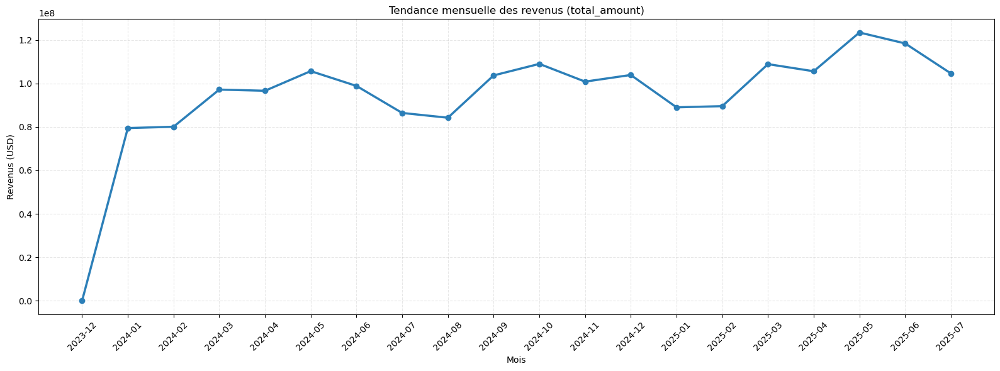

Revenu total sur la période: $1,885,318,751

Taux de pourboire (%) par type de paiement:
                    count   mean  median      std
payment_type                                     
Autre             9328598   2.54    0.00     9.88
Carte de crédit  48402749  26.49   26.09  1179.97
Espèces           8005485   0.00    0.00     0.36
Sans charge        321752   0.13    0.00    10.64
Dispute            763632   0.08    0.00     6.83
Inconnu                 2   0.00    0.00     0.00


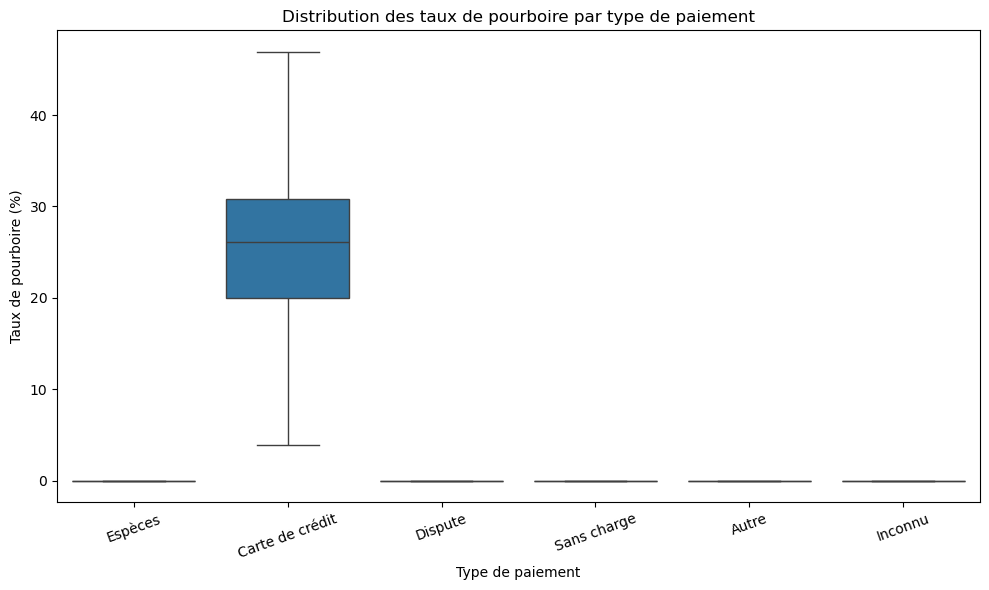

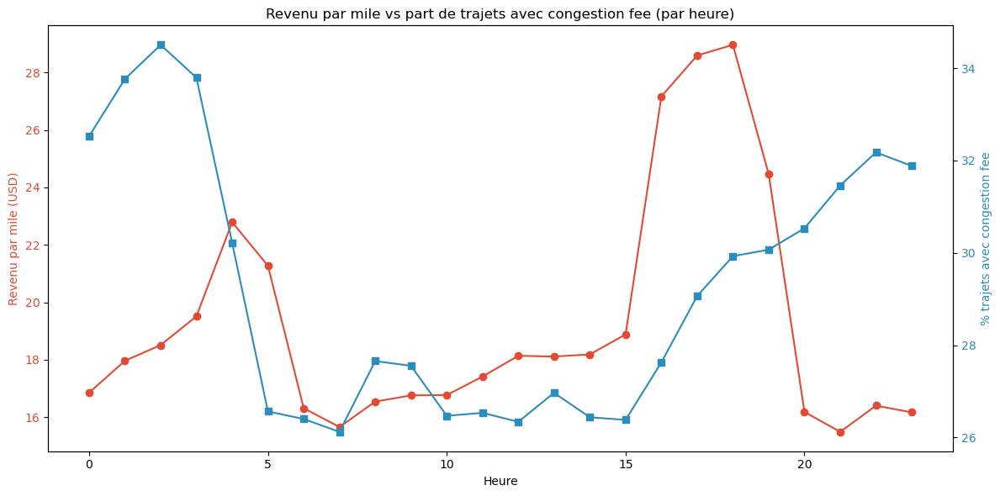


Revenu par mile moyen selon présence de congestion fee:
has_congestion
Sans congestion    19.807
1                  20.132


In [28]:
# Revenus agrégés et métriques unitaires
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assurer la présence de dropoff datetime
if 'tpep_dropoff_datetime' in df.columns and not pd.api.types.is_datetime64_any_dtype(df['tpep_dropoff_datetime']):
    df['tpep_dropoff_datetime'] = pd.to_datetime(df['tpep_dropoff_datetime'], errors='coerce')

# Durée de trajet (minutes) si possible
if 'tpep_dropoff_datetime' in df.columns:
    trip_time_min = (df['tpep_dropoff_datetime'] - df['tpep_pickup_datetime']).dt.total_seconds() / 60
    df['trip_time_min'] = trip_time_min

# Taux de pourboire (%), revenu/mile et revenu/minute (proxys)
dist = df['trip_distance'].clip(lower=0.1) if 'trip_distance' in df.columns else pd.Series(np.nan, index=df.index)
fares = df['fare_amount'] if 'fare_amount' in df.columns else pd.Series(np.nan, index=df.index)

df['tip_rate'] = np.where((fares > 0) & df['tip_amount'].notna(), (df['tip_amount'] / fares) * 100, np.nan) if 'tip_amount' in df.columns else np.nan

total_amt = df['total_amount'] if 'total_amount' in df.columns else pd.Series(np.nan, index=df.index)
df['revenue_per_mile'] = np.where(dist > 0, total_amt / dist, np.nan)
if 'trip_time_min' in df.columns:
    df['revenue_per_min'] = np.where(df['trip_time_min'] > 0, total_amt / df['trip_time_min'], np.nan)

# 1) Tendance mensuelle des revenus
if 'total_amount' in df.columns and 'year_month' in df.columns:
    monthly_rev = df.groupby('year_month')['total_amount'].sum().reset_index()
    plt.figure(figsize=(16,6))
    plt.plot(monthly_rev['year_month'], monthly_rev['total_amount'], marker='o', color='#2c7fb8', linewidth=2.5)
    plt.title('Tendance mensuelle des revenus (total_amount)')
    plt.xlabel('Mois')
    plt.ylabel('Revenus (USD)')
    plt.xticks(rotation=45)
    plt.grid(True, alpha=0.3, linestyle='--')
    plt.tight_layout()
    plt.show()
    print(f"Revenu total sur la période: ${monthly_rev['total_amount'].sum():,.0f}")
else:
    print("Colonnes manquantes pour la tendance mensuelle (total_amount, year_month).")

# 2) Taux de pourboire par moyen de paiement
if 'payment_type' in df.columns and 'tip_rate' in df.columns:
    labels_map = {1:"Carte de crédit", 2:"Espèces", 3:"Sans charge", 4:"Dispute", 5:"Inconnu", 0:"Autre"}
    tips_by_pay = (df.groupby('payment_type')['tip_rate']
                     .agg(['count','mean','median','std'])
                     .rename(index=labels_map))
    print("\nTaux de pourboire (%) par type de paiement:")
    print(tips_by_pay.round(2).to_string())

    # Visualisation
    plt.figure(figsize=(10,6))
    sns.boxplot(x=df['payment_type'].map(labels_map), y=df['tip_rate'], showfliers=False)
    plt.title('Distribution des taux de pourboire par type de paiement')
    plt.xlabel('Type de paiement')
    plt.ylabel('Taux de pourboire (%)')
    plt.xticks(rotation=20)
    plt.tight_layout()
    plt.show()
else:
    print("Colonnes manquantes pour l'analyse des pourboires (payment_type/tip_rate).")

# 3) Proxys de tarification dynamique: congestion fee et revenus unitaires par heure
if 'cbd_congestion_fee' in df.columns and 'hour' in df.columns:
    df['has_congestion'] = (df['cbd_congestion_fee'].fillna(0) > 0).astype(int)
    by_hour = df.groupby('hour').agg(
        avg_rev_mile=('revenue_per_mile','mean'),
        avg_rev_min=('revenue_per_min','mean'),
        share_congestion=('has_congestion','mean')
    ).reset_index()

    fig, ax1 = plt.subplots(figsize=(12,6))
    color1, color2 = '#e34a33', '#2b8cbe'
    ax1.plot(by_hour['hour'], by_hour['avg_rev_mile'], color=color1, marker='o', label='Revenu/mile (moy)')
    ax1.set_xlabel('Heure')
    ax1.set_ylabel('Revenu par mile (USD)', color=color1)
    ax1.tick_params(axis='y', labelcolor=color1)

    ax2 = ax1.twinx()
    ax2.plot(by_hour['hour'], by_hour['share_congestion']*100, color=color2, marker='s', label='% trajets avec congestion fee')
    ax2.set_ylabel('% trajets avec congestion fee', color=color2)
    ax2.tick_params(axis='y', labelcolor=color2)

    plt.title('Revenu par mile vs part de trajets avec congestion fee (par heure)')
    fig.tight_layout()
    plt.show()

    impact = df.groupby('has_congestion')['revenue_per_mile'].mean().rename({0:'Sans congestion','1':'Avec congestion'})
    print("\nRevenu par mile moyen selon présence de congestion fee:")
    print(impact.round(3).to_string())
else:
    print("Colonnes manquantes pour l'analyse congestion fee (cbd_congestion_fee/hour).")

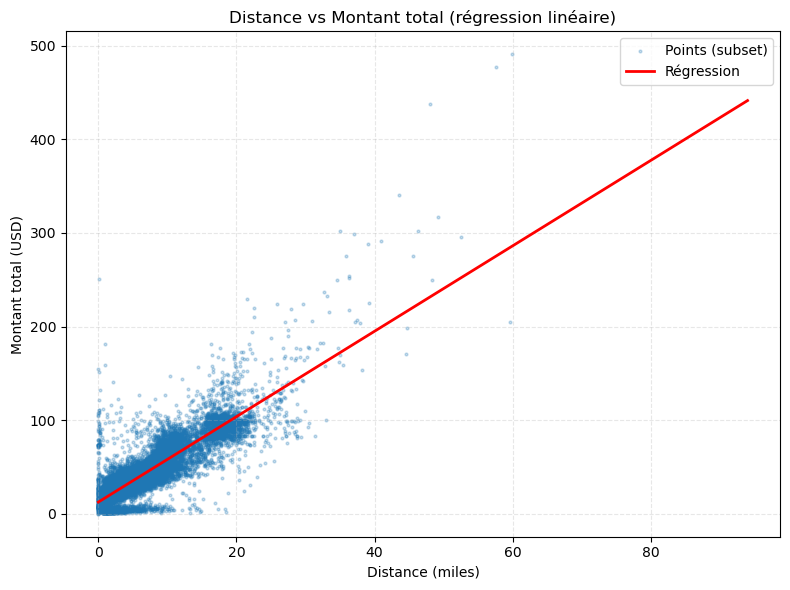

Slope (USD/mile): 4.562 | Intercept: 12.511 | R²: 0.8198 | N: 500000


In [29]:
# Régression linéaire simple distance -> total_amount
import numpy as np
import matplotlib.pyplot as plt

if 'trip_distance' in df.columns and 'total_amount' in df.columns:
    subset = df[(df['trip_distance']>0) & (df['total_amount']>0) & (df['trip_distance']<100) & (df['total_amount']<500)]
    n = len(subset)
    sample_n = 500_000 if n > 500_000 else n
    sample = subset.sample(sample_n, random_state=42) if n > sample_n else subset

    x = sample['trip_distance'].values
    y = sample['total_amount'].values

    # polyfit degré 1
    slope, intercept = np.polyfit(x, y, 1)
    y_pred = slope * x + intercept
    ss_res = np.sum((y - y_pred)**2)
    ss_tot = np.sum((y - y.mean())**2)
    r2 = 1 - ss_res/ss_tot

    # Plot
    plt.figure(figsize=(8,6))
    plt.scatter(x[:50_000], y[:50_000], s=4, alpha=0.25, label='Points (subset)')
    xs = np.linspace(0, x.max(), 200)
    plt.plot(xs, slope*xs + intercept, color='red', linewidth=2, label='Régression')
    plt.title('Distance vs Montant total (régression linéaire)')
    plt.xlabel('Distance (miles)')
    plt.ylabel('Montant total (USD)')
    plt.legend()
    plt.grid(alpha=0.3, linestyle='--')
    plt.tight_layout()
    plt.show()

    print(f"Slope (USD/mile): {slope:.3f} | Intercept: {intercept:.3f} | R²: {r2:.4f} | N: {sample_n}")
else:
    print("Colonnes nécessaires absentes pour la régression (trip_distance, total_amount).")

### Régression distance ↔ montant total

Relation linéaire approximative trip_distance → total_amount (échantillon pour performance).

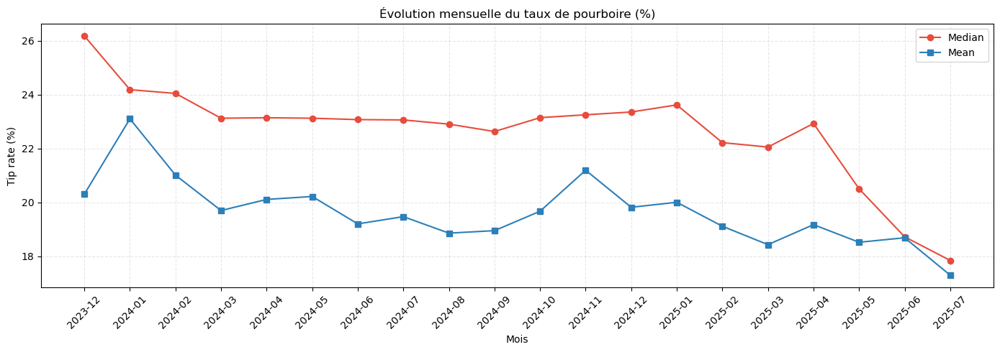

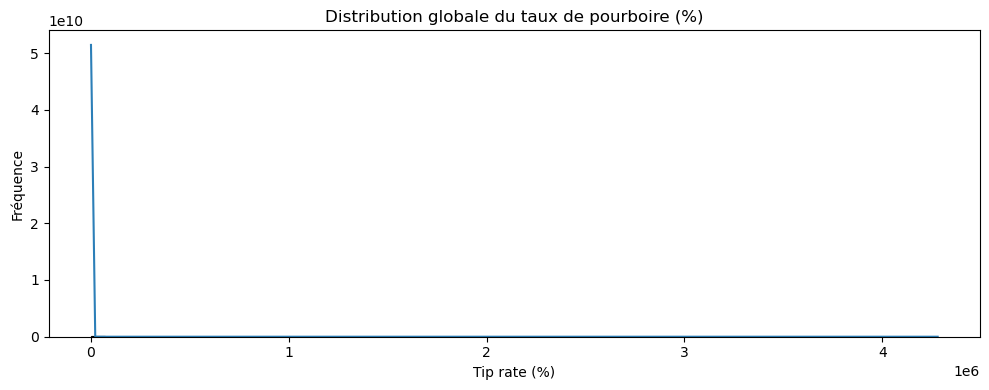

Stats globales tip_rate:
count    66822218.00
mean           19.55
std          1004.33
min             0.00
1%              0.00
5%              0.00
25%             0.00
50%            22.99
75%            28.84
95%            39.22
99%            50.97
max       4280000.00
Name: tip_rate, dtype: float64


In [30]:
# Evolution du tip_rate
import seaborn as sns
import matplotlib.pyplot as plt

if 'tip_rate' in df.columns and 'year_month' in df.columns:
    monthly_tips = (df.groupby('year_month')['tip_rate']
                      .agg(['count','mean','median','std'])
                      .reset_index())
    plt.figure(figsize=(14,5))
    plt.plot(monthly_tips['year_month'], monthly_tips['median'], marker='o', label='Median', color='#e74c3c')
    plt.plot(monthly_tips['year_month'], monthly_tips['mean'], marker='s', label='Mean', color='#2c7fb8')
    plt.title('Évolution mensuelle du taux de pourboire (%)')
    plt.xlabel('Mois')
    plt.ylabel('Tip rate (%)')
    plt.xticks(rotation=45)
    plt.grid(alpha=0.3, linestyle='--')
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Distribution globale
    plt.figure(figsize=(10,4))
    sns.histplot(df['tip_rate'], bins=60, color='#2c7fb8', kde=True)
    plt.title('Distribution globale du taux de pourboire (%)')
    plt.xlabel('Tip rate (%)')
    plt.ylabel('Fréquence')
    plt.tight_layout()
    plt.show()

    print('Stats globales tip_rate:')
    print(df['tip_rate'].describe(percentiles=[.01,.05,.25,.5,.75,.95,.99]).round(2))
else:
    print("Colonnes 'tip_rate' ou 'year_month' manquantes pour l'évolution.")

### Évolution mensuelle du taux de pourboire

Tendance du `tip_rate` par mois + distribution globale.

In [31]:
# Calcul des KPI principaux
import numpy as np
import pandas as pd

kpis = {}
# Total rides
kpis['total_rides'] = len(df)
# Période couverte
if 'year_month' in df.columns:
    months = sorted(df['year_month'].unique())
    kpis['months_covered'] = len(months)
    kpis['first_month'] = months[0]
    kpis['last_month'] = months[-1]
# Revenu total
if 'total_amount' in df.columns:
    kpis['total_revenue'] = float(df['total_amount'].sum())
    kpis['avg_revenue_per_ride'] = float(df['total_amount'].mean())
# Distance médiane / moyenne
if 'trip_distance' in df.columns:
    kpis['median_distance'] = float(df['trip_distance'].median())
    kpis['mean_distance'] = float(df['trip_distance'].mean())
# Tip rate median
if 'tip_rate' in df.columns:
    kpis['median_tip_rate_pct'] = float(df['tip_rate'].median(skipna=True))
# Heure de pointe globale
if 'hour' in df.columns:
    hour_counts = df['hour'].value_counts()
    kpis['peak_hour'] = int(hour_counts.idxmax())
    kpis['peak_hour_rides'] = int(hour_counts.max())
# Intra-Manhattan share (si df_geo)
if 'df_geo' in globals() and 'pickup_borough' in df_geo.columns and 'dropoff_borough' in df_geo.columns:
    manhattan_mask = (df_geo['pickup_borough'] == 'Manhattan') & (df_geo['dropoff_borough'] == 'Manhattan')
    kpis['intra_manhattan_pct'] = float(manhattan_mask.mean() * 100)

print("\n=========== KPI SYNTHÈSE ===========")
for k,v in kpis.items():
    if isinstance(v, float):
        if 'revenue' in k or 'avg_revenue' in k:
            print(f"{k}: {v:,.2f}")
        else:
            print(f"{k}: {v:,.3f}")
    else:
        print(f"{k}: {v}")
print("===================================\n")


=========== KPI SYNTHÈSE ===========
total_rides: 69152022
months_covered: 20
first_month: 2023-12
last_month: 2025-07
total_revenue: 1,885,318,750.92
avg_revenue_per_ride: 27.26
median_distance: 1.790
mean_distance: 5.741
median_tip_rate_pct: 22.985
peak_hour: 18
peak_hour_rides: 4983692



### KPI Synthèse

Cellule résumé des indicateurs clés (rides, revenu, tip median, pic horaire, etc.).

### Analyse des patterns géographiques

In [32]:
# Préparation des données géographiques: mapping zones -> boroughs pour pickup et dropoff
# On suppose que le DataFrame original est 'df' et la table des zones est 'zone'.

pickup_zone = zone[['LocationID','Borough','Zone']].rename(columns={'LocationID':'PULocationID','Borough':'pickup_borough','Zone':'pickup_zone'})
dropoff_zone = zone[['LocationID','Borough','Zone']].rename(columns={'LocationID':'DOLocationID','Borough':'dropoff_borough','Zone':'dropoff_zone'})

# Fusion pour ajouter les infos de borough et zone
geo_cols = ['PULocationID','DOLocationID','trip_distance']
df_geo = df[geo_cols].merge(pickup_zone, on='PULocationID', how='left').merge(dropoff_zone, on='DOLocationID', how='left')

print('Aperçu géographique enrichi:')
print(df_geo.head())
print('\nNombre de lignes:', len(df_geo))
missing_pickup = df_geo['pickup_borough'].isna().sum()
missing_dropoff = df_geo['dropoff_borough'].isna().sum()
print(f"Zones pickup manquantes: {missing_pickup} | Zones dropoff manquantes: {missing_dropoff}")

Aperçu géographique enrichi:
   PULocationID  DOLocationID  trip_distance pickup_borough  \
0           186            79           1.72      Manhattan   
1           140           236           1.80      Manhattan   
2           236            79           4.70      Manhattan   
3            79           211           1.40      Manhattan   
4           211           148           0.80      Manhattan   

                    pickup_zone dropoff_borough           dropoff_zone  
0  Penn Station/Madison Sq West       Manhattan           East Village  
1               Lenox Hill East       Manhattan  Upper East Side North  
2         Upper East Side North       Manhattan           East Village  
3                  East Village       Manhattan                   SoHo  
4                          SoHo       Manhattan        Lower East Side  

Nombre de lignes: 69152022
Zones pickup manquantes: 36033 | Zones dropoff manquantes: 298608


Top 15 zones pickup:
                 pickup_zone   rides      pct
              Midtown Center 3152050 4.558146
                 JFK Airport 3151789 4.557768
       Upper East Side South 3128758 4.524464
       Upper East Side North 2810893 4.064802
   Times Sq/Theatre District 2295628 3.319683
                Midtown East 2292211 3.314742
Penn Station/Madison Sq West 2245731 3.247528
         Lincoln Square East 2116433 3.060551
           LaGuardia Airport 2031375 2.937550
                 Murray Hill 1928426 2.788676
               Midtown North 1892624 2.736903
                    Union Sq 1858384 2.687389
       Upper West Side South 1847753 2.672016
                East Chelsea 1837264 2.656848
                Clinton East 1713573 2.477980

Top 15 zones dropoff:
                dropoff_zone   rides      pct
       Upper East Side North 2920705 4.223600
       Upper East Side South 2826307 4.087092
              Midtown Center 2546523 3.682500
   Times Sq/Theatre District 2168031

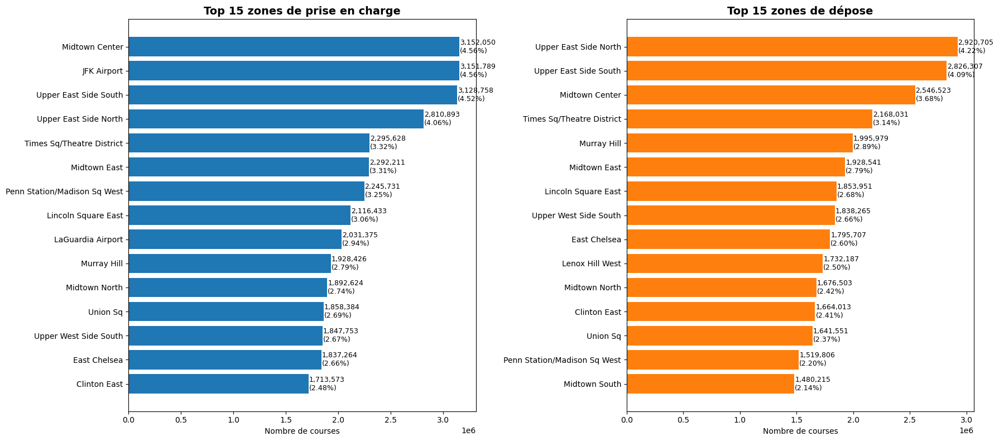

In [33]:
# Top zones de prise en charge et de dépose (Top 15)

top_pickup = (df_geo.groupby('pickup_zone').size().rename('rides')
              .reset_index().sort_values('rides', ascending=False).head(15))

top_dropoff = (df_geo.groupby('dropoff_zone').size().rename('rides')
               .reset_index().sort_values('rides', ascending=False).head(15))

total_rides = len(df_geo)

top_pickup['pct'] = top_pickup['rides'] / total_rides * 100
top_dropoff['pct'] = top_dropoff['rides'] / total_rides * 100

print('Top 15 zones pickup:')
print(top_pickup.to_string(index=False))
print('\nTop 15 zones dropoff:')
print(top_dropoff.to_string(index=False))

fig, axes = plt.subplots(1,2, figsize=(18,8))
axes[0].barh(top_pickup['pickup_zone'][::-1], top_pickup['rides'][::-1], color='#1f77b4')
axes[0].set_title('Top 15 zones de prise en charge', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Nombre de courses')
for i,(zone,val,pct) in enumerate(zip(top_pickup['pickup_zone'][::-1], top_pickup['rides'][::-1], top_pickup['pct'][::-1])):
    axes[0].text(val+5000, i, f"{val:,}\n({pct:.2f}%)", va='center', fontsize=9)

axes[1].barh(top_dropoff['dropoff_zone'][::-1], top_dropoff['rides'][::-1], color='#ff7f0e')
axes[1].set_title('Top 15 zones de dépose', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Nombre de courses')
for i,(zone,val,pct) in enumerate(zip(top_dropoff['dropoff_zone'][::-1], top_dropoff['rides'][::-1], top_dropoff['pct'][::-1])):
    axes[1].text(val+5000, i, f"{val:,}\n({pct:.2f}%)", va='center', fontsize=9)

plt.tight_layout()
plt.show()

In [34]:
# Matrice Origine-Destination par borough (flux de courses)
import pandas as pd
import numpy as np

# Filtrer les lignes avec borough défini
od_df = df_geo.dropna(subset=['pickup_borough','dropoff_borough'])

od_counts = (od_df.groupby(['pickup_borough','dropoff_borough'])
                 .size()
                 .rename('rides')
                 .reset_index())

# Pivot en matrice
od_matrix = od_counts.pivot(index='pickup_borough', columns='dropoff_borough', values='rides').fillna(0).astype(int)

# Total général
total_od = od_matrix.values.sum()

# Ajouter pourcentage
od_pct_matrix = od_matrix / total_od * 100

print('Matrice OD (nombre de courses):')
print(od_matrix)
print('\nMatrice OD (% des courses):')
print(od_pct_matrix.round(2))

# Intra vs Inter borough share
intra_mask = od_counts['pickup_borough'] == od_counts['dropoff_borough']
Intra_total = od_counts.loc[intra_mask,'rides'].sum()
Inter_total = total_od - Intra_total
intra_share = Intra_total / total_od * 100
inter_share = Inter_total / total_od * 100
print(f"\nPart Intra-borough: {intra_share:.2f}% | Part Inter-borough: {inter_share:.2f}%")

# Calcul des parts de rétention (intra) et émissions/réceptions pour chaque borough
borough_stats = []
for b in od_matrix.index:
    outbound = od_matrix.loc[b].sum()
    inbound = od_matrix[b].sum() if b in od_matrix.columns else 0
    intra = od_matrix.loc[b, b] if b in od_matrix.columns else 0
    retention_pct = intra / outbound * 100 if outbound else 0
    inbound_share_pct = inbound / total_od * 100
    outbound_share_pct = outbound / total_od * 100
    borough_stats.append({'borough': b,
                          'outbound_rides': outbound,
                          'inbound_rides': inbound,
                          'intra_rides': intra,
                          'retention_pct': retention_pct,
                          'outbound_share_pct': outbound_share_pct,
                          'inbound_share_pct': inbound_share_pct})

borough_stats_df = pd.DataFrame(borough_stats).sort_values('outbound_rides', ascending=False)
print('\nStatistiques par borough:')
print(borough_stats_df.to_string(index=False))

Matrice OD (nombre de courses):
dropoff_borough   Bronx  Brooklyn     EWR  Manhattan   Queens  Staten Island  \
pickup_borough                                                                 
Bronx            147489     22841      35     138724    24776             21   
Brooklyn          29236    889413     962     457995   184776           1896   
EWR                   5        13    8269        161       38              9   
Manhattan        232258   1300268  146916   56836877  1751934           6186   
Queens           136806    964998    5979    3459366  1755594           7498   
Staten Island        19      2247      27        686      165           1303   
Unknown             653      3856     347      65684     6229             25   

dropoff_borough  Unknown  
pickup_borough            
Bronx                955  
Brooklyn            3062  
EWR                  194  
Manhattan         141686  
Queens             11757  
Staten Island         13  
Unknown            95760  

Mat

In [35]:
# Folium: flux entre boroughs
try:
    import folium
except ImportError:
    print("Folium n'est pas installé. Exécutez: pip install folium")
else:
    # Si od_counts n'existe pas (exécution partielle), le recréer rapidement depuis df_geo
    if 'od_counts' not in globals():
        if 'df_geo' in globals():
            od_counts = (df_geo.dropna(subset=['pickup_borough','dropoff_borough'])
                              .groupby(['pickup_borough','dropoff_borough'])
                              .size().rename('rides').reset_index())
        else:
            raise RuntimeError("Les données géographiques (df_geo) ne sont pas disponibles.")

    # Centroides approximatifs des boroughs (lat, lon)
    centroids = {
        'Manhattan': (40.7831, -73.9712),
        'Brooklyn': (40.6782, -73.9442),
        'Queens': (40.7282, -73.7949),
        'Bronx': (40.8448, -73.8648),
        'Staten Island': (40.5795, -74.1502),
        'EWR': (40.6895, -74.1745)
    }

    # Carte centrée sur NYC
    m = folium.Map(location=[40.7128, -74.0060], zoom_start=10, tiles='cartodbpositron')

    # Arcs: poids proportionnel au nombre de trajets
    max_rides = od_counts['rides'].max() if len(od_counts) else 1
    for row in od_counts.itertuples(index=False):
        a, b, r = row.pickup_borough, row.dropoff_borough, row.rides
        if a in centroids and b in centroids and r > 0:
            latlon_a = centroids[a]
            latlon_b = centroids[b]
            weight = max(1, int(6 * (r / max_rides)))
            color = '#e34a33' if a == b else '#2b8cbe'
            folium.PolyLine(locations=[latlon_a, latlon_b], color=color, weight=weight, opacity=0.6,
                            tooltip=f"{a} → {b}: {r:,} courses").add_to(m)

    # Noeuds: taille proportionnelle au trafic total (entrant+sortant)
    borough_totals = (od_counts.groupby('pickup_borough')['rides'].sum()
                                .add(od_counts.groupby('dropoff_borough')['rides'].sum(), fill_value=0))
    max_tot = borough_totals.max() if len(borough_totals) else 1
    for b, tot in borough_totals.items():
        if b in centroids:
            lat, lon = centroids[b]
            radius = 6 + 14 * (tot / max_tot)
            folium.CircleMarker(location=[lat, lon], radius=radius, color='black', weight=1,
                                 fill=True, fill_color='#fdae61', fill_opacity=0.8,
                                 tooltip=f"{b}: {int(tot):,} trajets").add_to(m)

    # Sauvegarde + affichage
    out_path = r"processed/borough_flows_map.html"
    try:
        m.save(out_path)
        print(f"Carte sauvegardée: {out_path}")
    except Exception as e:
        print(f"Impossible d'enregistrer la carte: {e}")
    m

Carte sauvegardée: processed/borough_flows_map.html


In [36]:
# Ensure output directory exists for Folium export
import os
os.makedirs('processed', exist_ok=True)
print('Ensured processed/ directory exists: ', os.path.exists('processed') and os.path.isdir('processed'))

Ensured processed/ directory exists:  True


### Carte des flux entre boroughs (Folium)

Visualisation interactive des flux agrégés entre boroughs (poids des arcs proportionnel au volume).

In [37]:
# Distance moyenne par paire de boroughs (pickup -> dropoff)
# Utilise trip_distance dans df_geo

dist_df = df_geo.dropna(subset=['pickup_borough','dropoff_borough','trip_distance'])
borough_dist = (dist_df.groupby(['pickup_borough','dropoff_borough'])['trip_distance']
                        .agg(['count','mean','median','quantile'])
                        .rename(columns={'mean':'avg_distance','median':'median_distance','quantile':'q95_distance'}))
# Remplacer quantile par 95ème percentile personnalisé
borough_dist['q95_distance'] = (dist_df.groupby(['pickup_borough','dropoff_borough'])['trip_distance']
                                  .quantile(0.95).values)
borough_dist = borough_dist.reset_index().sort_values('avg_distance', ascending=False)

print('Distance moyenne (top 20 paires par distance moyenne):')
print(borough_dist.head(20).to_string(index=False))

Distance moyenne (top 20 paires par distance moyenne):
pickup_borough dropoff_borough  count  avg_distance  median_distance  q95_distance
 Staten Island       Manhattan    686    220.381691           15.800       24.2975
      Brooklyn             EWR    962    115.388680           17.635       26.3185
 Staten Island        Brooklyn   2247     64.440267            8.030       17.3570
         Bronx       Manhattan 138724     50.284348            7.300       14.9000
         Bronx           Bronx 147489     46.281090            2.900        8.2000
         Bronx        Brooklyn  22841     37.717720           16.200       24.6000
      Brooklyn           Bronx  29236     33.552158           16.220       23.4200
      Brooklyn       Manhattan 457995     33.538645            5.900       14.4000
      Brooklyn         Unknown   3062     33.519758            3.300       19.8000
        Queens             EWR   5979     33.267107           35.400       39.8660
           EWR          Queens  

In [38]:
# Top flux zone->zone (origine-destination) hors même zone (Top 25)
zone_flows = (df_geo.dropna(subset=['pickup_zone','dropoff_zone'])
                .query('pickup_zone != dropoff_zone')
                .groupby(['pickup_zone','dropoff_zone'])
                .size()
                .rename('rides')
                .reset_index()
                .sort_values('rides', ascending=False)
             )

zone_flows_top25 = zone_flows.head(25)
print('Top 25 flux zone->zone (excluant mêmes zones):')
print(zone_flows_top25.to_string(index=False))

Top 25 flux zone->zone (excluant mêmes zones):
                 pickup_zone              dropoff_zone  rides
       Upper East Side South     Upper East Side North 451727
       Upper East Side North     Upper East Side South 388484
              Midtown Center     Upper East Side South 216006
       Upper East Side South            Midtown Center 194249
              Midtown Center     Upper East Side North 179291
       Upper East Side South              Midtown East 168420
         Lincoln Square East     Upper West Side South 166764
       Upper West Side South       Lincoln Square East 165349
       Upper West Side South     Upper West Side North 160741
       Upper East Side North            Midtown Center 150746
             Lenox Hill West     Upper East Side North 147944
                 JFK Airport Times Sq/Theatre District 144004
Penn Station/Madison Sq West Times Sq/Theatre District 142665
       Upper West Side North     Upper West Side South 137352
       Upper East Side 

### Résumé des patterns géographiques

**Concentration Manhattan:** Plus de 82% des courses sont intra-Manhattan. Manhattan génère ~87.8% des départs et reçoit ~88.5% des arrivées.

**Flux inter-borough:** Seuls ~13.2% des trajets traversent un borough différent. Les principaux échanges inter-borough vont de Manhattan vers Queens et Brooklyn (ponts / aéroports).

**Retenue intra (intra-rides / sorties):** Manhattan ~94%, EWR ~95% (trajets internes liés à l'aéroport), Brooklyn ~57%, Queens ~28%, Bronx ~44%, Staten Island ~29% (forte dépendance externe).

**Distances moyennes élevées:** Staten Island → Manhattan (~220), Brooklyn → EWR (~115), Staten Island ↔ Brooklyn (>60). Les paires Manhattan-centric restent beaucoup plus courtes (médiane autour de 5–8).

**Aéroports:** JFK et LaGuardia apparaissent fortement dans les flux zone→zone vers Times Square / Midtown / Outside of NYC, ce qui reflète l’importance des trajets touristiques et de liaison.

**Zones dominantes (pickup & dropoff):** Midtown, JFK Airport, Upper East Side South/North dominent les départs. Upper East Side North/South et Midtown Center dominent les arrivées. Ces zones représentent chacune entre ~3% et ~4.6% du total.

**Top flux bi-directionnels internes:** Upper East Side South ↔ Upper East Side North dépasse 840k trajets combinés (mobilité locale intra-quartier).

**Interprétation stratégique:**
- Forte centralité de Manhattan justifie une densité d’offre plus élevée et des stratégies de répartition fine intra-borough.
- Les corridors vers JFK/LaGuardia et entre UES / Midtown sont des artères clés (possibles optimisations de pricing dynamique).
- Faible part inter-borough suggère segmentation des modèles de demande; Staten Island montre vulnérabilité (faible rétention, distances longues).

Prochaines extensions possibles: cartographie spatiale (choroplèth), temps moyen par flux, clustering de zones, évolution temporelle des flux (jour / heure).

## Visualisation Géographique avec Folium

In [23]:
# Charger le fichier de zones
zone = pd.read_csv('taxi_zone_lookup.csv')

# Calculer les statistiques par zone de départ (pickup)
pickup_stats = df.groupby('PULocationID').agg({
    'tpep_pickup_datetime': 'count',  # nombre de courses
    'trip_distance': 'mean',           # distance moyenne
    'total_amount': 'mean'             # montant moyen
}).reset_index()
pickup_stats.columns = ['LocationID', 'total_rides', 'avg_distance', 'avg_amount']

# Calculer les statistiques par zone d'arrivée (dropoff)
dropoff_stats = df.groupby('DOLocationID').agg({
    'tpep_pickup_datetime': 'count'
}).reset_index()
dropoff_stats.columns = ['LocationID', 'total_dropoffs']

# Fusionner avec les informations de zones
zone_stats = zone.merge(pickup_stats, on='LocationID', how='left')
zone_stats = zone_stats.merge(dropoff_stats, on='LocationID', how='left')
zone_stats.fillna(0, inplace=True)

print(f"Zones avec données: {len(zone_stats[zone_stats['total_rides'] > 0])}/{len(zone_stats)}")
zone_stats.head(10)

Zones avec données: 263/265


,LocationID,Borough,Zone,service_zone,total_rides,avg_distance,avg_amount,total_dropoffs
0,1,EWR,Newark Airport,EWR,8984.0,0.825633,94.301287,164137.0
1,2,Queens,Jamaica Bay,Boro Zone,100.0,13.669900,58.275600,140.0
2,3,Bronx,Allerton/Pelham Gardens,Boro Zone,4369.0,71.698746,34.176379,7665.0
3,4,Manhattan,Alphabet City,Yellow Zone,155795.0,9.517474,22.763667,292868.0
4,5,Staten Island,Arden Heights,Boro Zone,17.0,9.325294,77.121176,264.0
5,6,Staten Island,Arrochar/Fort Wadsworth,Boro Zone,1267.0,117.817806,26.900182,1960.0
6,7,Queens,Astoria,Boro Zone,82946.0,18.162182,24.985042,174409.0
7,8,Queens,Astoria Park,Boro Zone,561.0,6.110357,48.935116,1151.0
8,9,Queens,Auburndale,Boro Zone,2031.0,111.858843,30.142802,8081.0
9,10,Queens,Baisley Park,Boro Zone,29662.0,12.208287,58.132561,70987.0


In [40]:
# Créer une carte centrée sur NYC
import folium
from folium.plugins import HeatMap

# Coordonnées approximatives du centre de NYC
nyc_center = [40.7128, -74.0060]

# Créer la carte de base
m = folium.Map(
    location=nyc_center,
    zoom_start=11,
    tiles='cartodbpositron'
)

# Coordonnées approximatives des zones par borough (centroids)
# Ces coordonnées sont approximatives pour les principaux boroughs
borough_coords = {
    'Manhattan': [40.7831, -73.9712],
    'Brooklyn': [40.6782, -73.9442],
    'Queens': [40.7282, -73.7949],
    'Bronx': [40.8448, -73.8648],
    'Staten Island': [40.5795, -74.1502],
    'EWR': [40.6895, -74.1745]
}

# Agréger les données par borough
borough_stats = zone_stats.groupby('Borough').agg({
    'total_rides': 'sum',
    'total_dropoffs': 'sum',
    'avg_distance': 'mean',
    'avg_amount': 'mean'
}).reset_index()

print("Statistiques par Borough:")
print(borough_stats)

# Ajouter des cercles pour chaque borough
for _, row in borough_stats.iterrows():
    borough = row['Borough']
    if borough in borough_coords and row['total_rides'] > 0:
        coords = borough_coords[borough]
        
        # Taille du cercle proportionnelle au nombre de courses
        radius = (row['total_rides'] / borough_stats['total_rides'].max()) * 15000
        
        # Couleur selon l'intensité
        if row['total_rides'] > borough_stats['total_rides'].quantile(0.75):
            color = 'red'
        elif row['total_rides'] > borough_stats['total_rides'].quantile(0.50):
            color = 'orange'
        else:
            color = 'yellow'
        
        # Ajouter le cercle
        folium.Circle(
            location=coords,
            radius=radius,
            popup=f"""<b>{borough}</b><br>
                     Courses départ: {int(row['total_rides']):,}<br>
                     Courses arrivée: {int(row['total_dropoffs']):,}<br>
                     Distance moy: {row['avg_distance']:.2f} miles<br>
                     Montant moy: ${row['avg_amount']:.2f}""",
            tooltip=f"{borough}: {int(row['total_rides']):,} courses",
            color=color,
            fill=True,
            fillColor=color,
            fillOpacity=0.5,
            weight=2
        ).add_to(m)
        
        # Ajouter un marqueur avec le nom
        folium.Marker(
            location=coords,
            icon=folium.DivIcon(html=f"""
                <div style="font-size: 12pt; color: black; font-weight: bold; 
                            text-shadow: 1px 1px 2px white, -1px -1px 2px white;">
                    {borough}
                </div>
            """)
        ).add_to(m)

# Ajouter une légende
legend_html = '''
<div style="position: fixed; 
            bottom: 50px; left: 50px; width: 250px; height: auto; 
            background-color: white; z-index:9999; font-size:14px;
            border:2px solid grey; border-radius: 5px; padding: 10px">
<p style="margin:0; font-weight:bold;">Volume de courses</p>
<p style="margin:5px 0;"><span style="color:red;">●</span> Très élevé (>75%)</p>
<p style="margin:5px 0;"><span style="color:orange;">●</span> Élevé (50-75%)</p>
<p style="margin:5px 0;"><span style="color:yellow;">●</span> Modéré (<50%)</p>
<p style="margin:5px 0; font-size:12px; font-style:italic;">
Taille du cercle = volume de courses
</p>
</div>
'''
m.get_root().html.add_child(folium.Element(legend_html))

# Sauvegarder la carte
out_path = 'borough_flows_map.html'
m.save(out_path)
print(f"\nCarte sauvegardée: {out_path}")

# Afficher la carte
m

Statistiques par Borough:
         Borough  total_rides  total_dropoffs  avg_distance  avg_amount
0              0      36033.0        298608.0      9.589398   93.570742
1          Bronx     335778.0        546809.0     47.771621   33.183465
2       Brooklyn    1569493.0       3184336.0     23.473840   29.371190
3            EWR       8984.0        164137.0      0.825633   94.301287
4      Manhattan   60500796.0      60961456.0      8.189694   24.502271
5         Queens    6523235.0       3725806.0     23.928124   36.595464
6  Staten Island       4505.0         16980.0     27.792877   50.609939
7        Unknown     173198.0        253890.0      3.669040   30.249288

Carte sauvegardée: borough_flows_map.html


### Carte Interactive Détaillée par Zone

In [41]:
# Préparer les données pour la visualisation détaillée
# Sélectionner les zones les plus actives (top 50)
top_zones = zone_stats.nlargest(50, 'total_rides')[zone_stats['total_rides'] > 0].copy()

# Calculer le revenu total par zone
top_zones['total_revenue'] = top_zones['total_rides'] * top_zones['avg_amount']
top_zones['revenue_per_ride'] = top_zones['avg_amount']

print(f"Top 50 zones les plus actives:")
print(f"Total des courses: {top_zones['total_rides'].sum():,.0f}")
print(f"Revenu total: ${top_zones['total_revenue'].sum():,.2f}")
print(f"Revenu moyen par course: ${top_zones['revenue_per_ride'].mean():.2f}")
print("\nAperçu des données:")
top_zones[['Zone', 'Borough', 'total_rides', 'avg_amount', 'total_revenue']].head(10)

Top 50 zones les plus actives:
Total des courses: 64,375,460
Revenu total: $1,745,927,490.90
Revenu moyen par course: $26.17

Aperçu des données:


C:\Users\nzigu\AppData\Local\Temp\ipykernel_33124\3363502957.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  top_zones = zone_stats.nlargest(50, 'total_rides')[zone_stats['total_rides'] > 0].copy()


,Zone,Borough,total_rides,avg_amount,total_revenue
160,Midtown Center,Manhattan,3152050.0,24.508185,7.725103e+07
131,JFK Airport,Queens,3151789.0,75.016775,2.364370e+08
236,Upper East Side South,Manhattan,3128758.0,20.312790,6.355380e+07
235,Upper East Side North,Manhattan,2810893.0,20.652945,5.805322e+07
229,Times Sq/Theatre District,Manhattan,2295628.0,27.337266,6.275619e+07
161,Midtown East,Manhattan,2292211.0,23.842045,5.465100e+07
185,Penn Station/Madison Sq West,Manhattan,2245731.0,24.448160,5.490399e+07
141,Lincoln Square East,Manhattan,2116433.0,21.672440,4.586827e+07
137,LaGuardia Airport,Queens,2031375.0,66.452169,1.349893e+08
169,Murray Hill,Manhattan,1928426.0,23.382246,4.509093e+07


In [42]:
# Coordonnées approximatives des principales zones de NYC
# Ces coordonnées représentent les zones les plus importantes
gdf_zones = {
    'Upper East Side South': [40.7682, -73.9626],
    'Upper East Side North': [40.7736, -73.9566],
    'Upper West Side South': [40.7870, -73.9754],
    'Upper West Side North': [40.7938, -73.9708],
    'Midtown Center': [40.7590, -73.9845],
    'Midtown East': [40.7549, -73.9712],
    'Midtown South': [40.7505, -73.9885],
    'Midtown North': [40.7614, -73.9776],
    'Times Sq/Theatre District': [40.7580, -74.0020],
    'Penn Station/Madison Sq West': [40.7505, -73.9934],
    'Union Sq': [40.7359, -73.9911],
    'East Village': [40.7264, -73.9818],
    'West Village': [40.7353, -74.0027],
    'Greenwich Village South': [40.7308, -74.0020],
    'Greenwich Village North': [40.7335, -73.9969],
    'SoHo': [40.7233, -74.0030],
    'TriBeCa/Civic Center': [40.7163, -74.0086],
    'Financial District North': [40.7089, -74.0089],
    'Financial District South': [40.7033, -74.0120],
    'Murray Hill': [40.7478, -73.9754],
    'Gramercy': [40.7369, -73.9850],
    'Stuyvesant Town/Peter Cooper Village': [40.7316, -73.9754],
    'Lenox Hill East': [40.7671, -73.9574],
    'Lenox Hill West': [40.7699, -73.9631],
    'Lincoln Square East': [40.7736, -73.9850],
    'Lincoln Square West': [40.7752, -73.9881],
    'Clinton East': [40.7622, -73.9924],
    'Clinton West': [40.7650, -73.9964],
    'Chelsea': [40.7465, -74.0014],
    'Flatiron': [40.7410, -73.9896],
    'East Harlem North': [40.7958, -73.9426],
    'East Harlem South': [40.7903, -73.9467],
    'Central Harlem': [40.8116, -73.9465],
    'Central Harlem North': [40.8206, -73.9426],
    'Morningside Heights': [40.8093, -73.9610],
    'Battery Park': [40.7035, -74.0170],
    'Battery Park City': [40.7088, -74.0156],
    'Chinatown': [40.7158, -73.9970],
    'Little Italy/NoLiTa': [40.7214, -73.9954],
    'Lower East Side': [40.7154, -73.9870],
    'Alphabet City': [40.7241, -73.9761],
    'JFK Airport': [40.6413, -73.7781],
    'LaGuardia Airport': [40.7769, -73.8740],
    'Newark Airport': [40.6895, -74.1745],
    'Astoria': [40.7644, -73.9235],
    'Long Island City/Queens Plaza': [40.7506, -73.9378],
    'Long Island City/Hunters Point': [40.7424, -73.9485],
    'Williamsburg (North Side)': [40.7201, -73.9570],
    'Williamsburg (South Side)': [40.7081, -73.9571],
    'Brooklyn Heights': [40.6956, -73.9955],
    'Downtown Brooklyn/MetroTech': [40.6929, -73.9862],
    'Fort Greene': [40.6898, -73.9743],
    'Park Slope': [40.6710, -73.9778],
    'Prospect Heights': [40.6776, -73.9681],
    'Crown Heights North': [40.6705, -73.9428],
    'Crown Heights South': [40.6645, -73.9410]
}

print(f"Coordonnées disponibles pour {len(gdf_zones)} zones")

Coordonnées disponibles pour 56 zones


In [43]:
# Créer une carte interactive détaillée avec marqueurs pour chaque zone
import folium
from folium import plugins

# Créer la carte de base
map_detailed = folium.Map(
    location=nyc_center,
    zoom_start=12,
    tiles='cartodbpositron'
)

# Ajouter des marqueurs pour chaque zone avec coordonnées disponibles
zones_added = 0
zones_with_coords = []

for _, row in top_zones.iterrows():
    zone_name = row['Zone']
    if zone_name in gdf_zones:
        coords = gdf_zones[zone_name]
        
        # Calculer la couleur selon le volume de courses
        if row['total_rides'] > top_zones['total_rides'].quantile(0.90):
            color = 'red'
            icon = 'fire'
        elif row['total_rides'] > top_zones['total_rides'].quantile(0.75):
            color = 'orange'
            icon = 'star'
        elif row['total_rides'] > top_zones['total_rides'].quantile(0.50):
            color = 'blue'
            icon = 'info-sign'
        else:
            color = 'green'
            icon = 'ok-sign'
        
        # Créer le popup avec toutes les informations
        popup_html = f"""
        <div style="font-family: Arial; width: 250px;">
            <h4 style="color: {color}; margin: 5px 0;">{zone_name}</h4>
            <hr style="margin: 5px 0;">
            <b>Borough:</b> {row['Borough']}<br>
            <br>
            <b style="font-size: 14pt;">📊 Courses</b><br>
            <b>• Départs:</b> {int(row['total_rides']):,} courses<br>
            <b>• Arrivées:</b> {int(row['total_dropoffs']):,} courses<br>
            <br>
            <b style="font-size: 14pt;">💰 Revenus</b><br>
            <b>• Total:</b> ${row['total_revenue']:,.2f}<br>
            <b>• Par course:</b> ${row['revenue_per_ride']:.2f}<br>
            <b>• Distance moy:</b> {row['avg_distance']:.2f} miles<br>
        </div>
        """
        
        # Ajouter le marqueur
        folium.Marker(
            location=coords,
            popup=folium.Popup(popup_html, max_width=300),
            tooltip=f"{zone_name}: {int(row['total_rides']):,} courses | ${row['total_revenue']:,.0f}",
            icon=folium.Icon(color=color, icon=icon, prefix='glyphicon')
        ).add_to(map_detailed)
        
        zones_added += 1
        zones_with_coords.append({
            'zone': zone_name,
            'rides': row['total_rides'],
            'revenue': row['total_revenue']
        })

print(f"\n{zones_added} zones ajoutées à la carte")
print(f"Zones avec le plus de courses:")
for z in sorted(zones_with_coords, key=lambda x: x['rides'], reverse=True)[:5]:
    print(f"  • {z['zone']}: {int(z['rides']):,} courses, ${z['revenue']:,.0f}")


36 zones ajoutées à la carte
Zones avec le plus de courses:
  • Midtown Center: 3,152,050 courses, $77,251,025
  • JFK Airport: 3,151,789 courses, $236,437,046
  • Upper East Side South: 3,128,758 courses, $63,553,803
  • Upper East Side North: 2,810,893 courses, $58,053,218
  • Times Sq/Theatre District: 2,295,628 courses, $62,756,194


In [44]:
# Ajouter une légende détaillée et sauvegarder
legend_html_detailed = '''
<div style="position: fixed; 
            top: 10px; right: 10px; width: 280px; height: auto; 
            background-color: white; z-index:9999; font-size:13px;
            border:2px solid grey; border-radius: 8px; padding: 15px;
            box-shadow: 2px 2px 6px rgba(0,0,0,0.3);">
    <h4 style="margin:0 0 10px 0; text-align: center; color: #333;">📊 Légende</h4>
    <hr style="margin: 10px 0;">
    
    <p style="margin:5px 0; font-weight:bold; color:#555;">Volume de Courses:</p>
    <p style="margin:3px 0; padding-left:10px;">
        <span style="color:red;">🔥</span> Très élevé (>90%)
    </p>
    <p style="margin:3px 0; padding-left:10px;">
        <span style="color:orange;">⭐</span> Élevé (75-90%)
    </p>
    <p style="margin:3px 0; padding-left:10px;">
        <span style="color:blue;">ℹ️</span> Modéré (50-75%)
    </p>
    <p style="margin:3px 0; padding-left:10px;">
        <span style="color:green;">✓</span> Faible (<50%)
    </p>
    
    <hr style="margin: 10px 0;">
    
    <p style="margin:5px 0; font-size:11px; font-style:italic; color:#666;">
        💡 Cliquez sur les marqueurs pour voir les détails complets
    </p>
    
    <p style="margin:5px 0; font-size:11px; color:#666;">
        • Nombre de courses (départ/arrivée)<br>
        • Revenu total généré<br>
        • Revenu moyen par course<br>
        • Distance moyenne
    </p>
</div>
'''

map_detailed.get_root().html.add_child(folium.Element(legend_html_detailed))

# Ajouter un titre sur la carte
title_html = '''
<div style="position: fixed; 
            top: 10px; left: 50px; 
            background-color: rgba(255,255,255,0.9); 
            z-index:9999; padding: 10px 20px;
            border-radius: 5px; border: 2px solid #333;">
    <h3 style="margin:0; color:#333;">🗺️ Carte Interactive des Zones de Taxi NYC</h3>
    <p style="margin:5px 0 0 0; font-size:12px; color:#666;">
        Top 50 zones les plus actives (2023-2025)
    </p>
</div>
'''

map_detailed.get_root().html.add_child(folium.Element(title_html))

# Sauvegarder la carte
out_path_detailed = 'zones_detailed_map.html'
map_detailed.save(out_path_detailed)
print(f"\n✅ Carte interactive détaillée sauvegardée: {out_path_detailed}")
print(f"📍 {zones_added} zones représentées sur la carte")
print(f"💰 Revenu total représenté: ${sum(z['revenue'] for z in zones_with_coords):,.2f}")

# Afficher la carte
map_detailed


✅ Carte interactive détaillée sauvegardée: zones_detailed_map.html
📍 36 zones représentées sur la carte
💰 Revenu total représenté: $1,452,719,787.12


## 🗺️ Carte Choroplèthe avec Géométries Réelles (Shapefile)

Utilisation du shapefile `taxi_zones.shp` pour afficher les **polygones exacts** de chaque zone NYC, colorés selon les métriques (courses, revenus, heures de pointe).

In [20]:
# Vérifier et installer geopandas si nécessaire
try:
    import geopandas as gpd
    print("✅ geopandas déjà installé")
except ImportError:
    print("📦 Installation de geopandas...")
    import sys
    !{sys.executable} -m pip install geopandas -q
    import geopandas as gpd
    print("✅ geopandas installé avec succès")

import folium
from branca.colormap import LinearColormap
import json

📦 Installation de geopandas...



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


✅ geopandas installé avec succès


In [21]:
# Charger le shapefile des zones NYC
gdf_zones = gpd.read_file('taxi_zones.shp')

# Renommer la colonne pour correspondre à nos données
if 'LocationID' not in gdf_zones.columns and 'OBJECTID' in gdf_zones.columns:
    gdf_zones.rename(columns={'OBJECTID': 'LocationID'}, inplace=True)

# S'assurer que la projection est en WGS84 pour Folium
if gdf_zones.crs != 'EPSG:4326':
    gdf_zones = gdf_zones.to_crs('EPSG:4326')

print(f"📍 Shapefile chargé: {len(gdf_zones)} zones")
print(f"   Colonnes: {list(gdf_zones.columns)}")
print(f"   CRS: {gdf_zones.crs}")
gdf_zones.head(3)

📍 Shapefile chargé: 263 zones
   Colonnes: ['OBJECTID', 'Shape_Leng', 'Shape_Area', 'zone', 'LocationID', 'borough', 'geometry']
   CRS: EPSG:4326


,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry
0,1,0.116357,0.000782,Newark Airport,1,EWR,"POLYGON ((-74.18445 40.695, -74.18449 40.6951,..."
1,2,0.433470,0.004866,Jamaica Bay,2,Queens,"MULTIPOLYGON (((-73.82338 40.63899, -73.82277 ..."
2,3,0.084341,0.000314,Allerton/Pelham Gardens,3,Bronx,"POLYGON ((-73.84793 40.87134, -73.84725 40.870..."


In [25]:
# Fusionner les géométries avec zone_stats (déjà calculé précédemment)
gdf_merged = gdf_zones.merge(zone_stats, on='LocationID', how='left')
gdf_merged['total_rides'] = gdf_merged['total_rides'].fillna(0)
gdf_merged['avg_amount'] = gdf_merged['avg_amount'].fillna(0)
gdf_merged['total_revenue'] = gdf_merged['total_rides'] * gdf_merged['avg_amount']

# Filtrer les zones avec au moins 100 courses pour un rendu lisible
gdf_active = gdf_merged[gdf_merged['total_rides'] >= 100].copy()

print(f"🎯 Zones actives (≥100 courses): {len(gdf_active)}/{len(gdf_merged)}")
print(f"💰 Revenue total: ${gdf_active['total_revenue'].sum():,.2f}")
print(f"🚕 Courses totales: {gdf_active['total_rides'].sum():,.0f}")

# Afficher aperçu (détecter automatiquement les noms de colonnes après merge)
display_cols = ['zone', 'borough', 'total_rides', 'avg_amount', 'total_revenue']
gdf_active[display_cols].head(10)

🎯 Zones actives (≥100 courses): 250/263
💰 Revenue total: $1,877,105,646.90
🚕 Courses totales: 68,954,201


,zone,borough,total_rides,avg_amount,total_revenue
0,Newark Airport,EWR,8984.0,94.301287,847202.76
1,Jamaica Bay,Queens,100.0,58.275600,5827.56
2,Allerton/Pelham Gardens,Bronx,4369.0,34.176379,149316.60
3,Alphabet City,Manhattan,155795.0,22.763667,3546465.49
5,Arrochar/Fort Wadsworth,Staten Island,1267.0,26.900182,34082.53
6,Astoria,Queens,82946.0,24.985042,2072409.29
7,Astoria Park,Queens,561.0,48.935116,27452.60
8,Auburndale,Queens,2031.0,30.142802,61220.03
9,Baisley Park,Queens,29662.0,58.132561,1724328.02
10,Bath Beach,Brooklyn,3333.0,31.164017,103869.67


In [30]:
# Créer une carte choroplèthe interactive avec Folium
# Métrique à visualiser: nombre de courses par zone

# Préparer le GeoJSON pour Folium
geojson_data = json.loads(gdf_active.to_json())

# Centre de la carte (NYC)
nyc_center = [40.7128, -74.0060]

# Créer la carte de base
map_choropleth = folium.Map(
    location=nyc_center,
    zoom_start=11,
    tiles='cartodbpositron'
)

# Colormap pour le nombre de courses
vmin = gdf_active['total_rides'].quantile(0.05)
vmax = gdf_active['total_rides'].quantile(0.95)
colormap_rides = LinearColormap(
    colors=['#ffffcc', '#a1dab4', '#41b6c4', '#2c7fb8', '#253494'],
    vmin=vmin,
    vmax=vmax,
    caption='Nombre de courses par zone'
)

# Ajouter la couche choroplèthe
folium.Choropleth(
    geo_data=geojson_data,
    name='Courses par Zone',
    data=gdf_active,
    columns=['LocationID', 'total_rides'],
    key_on='feature.properties.LocationID',
    fill_color='YlGnBu',
    fill_opacity=0.7,
    line_opacity=0.3,
    legend_name='Nombre de Courses',
    highlight=True
).add_to(map_choropleth)

# Ajouter des tooltips riches avec toutes les infos
style_function = lambda x: {'fillColor': '#ffffff', 'color':'#000000', 'fillOpacity': 0.1, 'weight': 0.1}
highlight_function = lambda x: {'fillColor': '#000000', 'color':'#000000', 'fillOpacity': 0.50, 'weight': 0.1}

folium.GeoJson(
    geojson_data,
    style_function=style_function,
    highlight_function=highlight_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['zone', 'borough', 'total_rides', 'avg_amount', 'avg_distance'],
        aliases=['Zone:', 'Borough:', 'Courses:', 'Prix moyen ($):', 'Distance moy (miles):'],
        localize=True,
        sticky=False,
        labels=True,
        style="""
            background-color: #F0EFEF;
            border: 2px solid black;
            border-radius: 3px;
            box-shadow: 3px;
        """,
        max_width=800,
    )
).add_to(map_choropleth)

# Ajouter la colormap comme légende
colormap_rides.add_to(map_choropleth)

# Titre
title_html = '''
<div style="position: fixed; 
            top: 10px; left: 50px; width: 500px; height: 60px; 
            background-color:white; border:2px solid grey; z-index:9999; 
            font-size:16px; font-weight:bold; padding: 10px">
    🗺️ NYC Taxi Zones - Volume de Courses (Géométries Réelles)
</div>
'''
map_choropleth.get_root().html.add_child(folium.Element(title_html))

# Sauvegarder
out_choropleth = 'nyc_zones_choropleth_rides.html'
map_choropleth.save(out_choropleth)
print(f"✅ Carte choroplèthe sauvegardée: {out_choropleth}")

map_choropleth

✅ Carte choroplèthe sauvegardée: nyc_zones_choropleth_rides.html


In [28]:
# Créer une carte choroplèthe pour le REVENU par zone

# Créer la carte de base
map_revenue = folium.Map(
    location=nyc_center,
    zoom_start=11,
    tiles='cartodbpositron'
)

# Colormap pour le revenu
vmin_rev = gdf_active['total_revenue'].quantile(0.05)
vmax_rev = gdf_active['total_revenue'].quantile(0.95)
colormap_revenue = LinearColormap(
    colors=['#fee5d9', '#fcae91', '#fb6a4a', '#de2d26', '#a50f15'],
    vmin=vmin_rev,
    vmax=vmax_rev,
    caption='Revenu total par zone ($)'
)

# Ajouter la couche choroplèthe
folium.Choropleth(
    geo_data=geojson_data,
    name='Revenu par Zone',
    data=gdf_active,
    columns=['LocationID', 'total_revenue'],
    key_on='feature.properties.LocationID',
    fill_color='OrRd',
    fill_opacity=0.7,
    line_opacity=0.3,
    legend_name='Revenu Total ($)',
    highlight=True
).add_to(map_revenue)

# Ajouter des tooltips avec infos de revenu
folium.GeoJson(
    geojson_data,
    style_function=style_function,
    highlight_function=highlight_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['zone', 'borough', 'total_rides', 'total_revenue', 'avg_amount'],
        aliases=['Zone:', 'Borough:', 'Courses:', 'Revenu Total ($):', 'Prix moyen ($):'],
        localize=True,
        sticky=False,
        labels=True,
        style="""
            background-color: #F0EFEF;
            border: 2px solid black;
            border-radius: 3px;
            box-shadow: 3px;
        """,
        max_width=800,
    )
).add_to(map_revenue)

# Ajouter la colormap comme légende
colormap_revenue.add_to(map_revenue)

# Titre
title_html_rev = '''
<div style="position: fixed; 
            top: 10px; left: 50px; width: 500px; height: 60px; 
            background-color:white; border:2px solid grey; z-index:9999; 
            font-size:16px; font-weight:bold; padding: 10px">
    💰 NYC Taxi Zones - Revenu Total par Zone (Géométries Réelles)
</div>
'''
map_revenue.get_root().html.add_child(folium.Element(title_html_rev))

# Sauvegarder
out_revenue_choropleth = 'nyc_zones_choropleth_revenue.html'
map_revenue.save(out_revenue_choropleth)
print(f"✅ Carte choroplèthe revenue sauvegardée: {out_revenue_choropleth}")

map_revenue

✅ Carte choroplèthe revenue sauvegardée: nyc_zones_choropleth_revenue.html


### Carte de comparaison des revenus par zone (année, mois, heure de pointe)

In [38]:
"""Calcul optimisé des revenus par zone (année, mois, heure de pointe)
Évite MemoryError en réduisant les colonnes et en évitant copy() inutile.
"""

# 1. Validation et réduction mémoire
if not np.issubdtype(df['tpep_pickup_datetime'].dtype, np.datetime64):
    df['tpep_pickup_datetime'] = pd.to_datetime(df['tpep_pickup_datetime'], errors='coerce')

needed_cols = ['tpep_pickup_datetime','PULocationID','total_amount']
needed_cols = [c for c in needed_cols if c in df.columns]

row_count = len(df)
use_chunks = row_count > 5_000_000
batch_size = 2_000_000 if use_chunks else row_count

def iter_batches():
    for start in range(0, row_count, batch_size):
        end = min(start + batch_size, row_count)
        yield df.iloc[start:end][needed_cols]

# Accumulate filtered & date parts via chunk processing
from collections import defaultdict
import calendar

month_names = {1:'Janvier', 2:'Février', 3:'Mars', 4:'Avril', 5:'Mai', 6:'Juin',
               7:'Juillet', 8:'Août', 9:'Septembre', 10:'Octobre', 11:'Novembre', 12:'Décembre'}

year_acc = defaultdict(lambda: [0.0,0])
month_acc = defaultdict(lambda: [0.0,0])
hour_acc = defaultdict(lambda: [0.0,0])

processed_rows = 0
for i, part in enumerate(iter_batches(), 1):
    part = part.dropna(subset=['tpep_pickup_datetime','PULocationID','total_amount'])
    years = part['tpep_pickup_datetime'].dt.year
    mask_year = (years >= 2023) & (years <= 2025)
    part = part.loc[mask_year]
    if part.empty:
        continue
    part_year = years.loc[mask_year]
    part_month = part['tpep_pickup_datetime'].dt.month
    part_hour = part['tpep_pickup_datetime'].dt.hour
    # Group by year
    gy = part.groupby([part['PULocationID'], part_year])['total_amount'].agg(['sum','count'])
    for (pul, yr), vals in gy.iterrows():
        year_acc[(int(pul), int(yr))][0] += float(vals['sum'])
        year_acc[(int(pul), int(yr))][1] += int(vals['count'])
    gm = part.groupby([part['PULocationID'], part_year, part_month])['total_amount'].agg(['sum','count'])
    for (pul, yr, mo), vals in gm.iterrows():
        month_acc[(int(pul), int(yr), int(mo))][0] += float(vals['sum'])
        month_acc[(int(pul), int(yr), int(mo))][1] += int(vals['count'])
    gh = part.groupby([part['PULocationID'], part_hour])['total_amount'].agg(['sum','count'])
    for (pul, hr), vals in gh.iterrows():
        hour_acc[(int(pul), int(hr))][0] += float(vals['sum'])
        hour_acc[(int(pul), int(hr))][1] += int(vals['count'])
    processed_rows += len(part)
    if use_chunks:
        print(f"Chunk {i}: {processed_rows:,} lignes cumulées")

print(f"Total lignes retenues (2023-2025): {processed_rows:,}")

# 2. Agrégations ciblées
from collections import defaultdict

rev_year_zone = (
    pd.DataFrame(
        [(pul, yr, v[0], v[1]) for (pul, yr), v in year_acc.items()],
        columns=['PULocationID','year','total_revenue','rides']
    )
)

rev_year_pivot = rev_year_zone.pivot(index='PULocationID', columns='year', values='total_revenue')
rev_year_pivot.columns = [f'revenue_{c}' for c in rev_year_pivot.columns]
rev_year_pivot = rev_year_pivot.reset_index()

rev_month_zone = (
    pd.DataFrame(
        [(pul, yr, mo, v[0], v[1]) for (pul, yr, mo), v in month_acc.items()],
        columns=['PULocationID','year','month','month_revenue','month_rides']
    )
)
idx_max_month = rev_month_zone.groupby('PULocationID')['month_revenue'].idxmax()
peak_month_zone = rev_month_zone.loc[idx_max_month].rename(
    columns={'year':'peak_month_year','month':'peak_month','month_revenue':'peak_month_revenue'}
)
peak_month_zone['peak_month_name'] = peak_month_zone['peak_month'].map(month_names)

rev_hour_zone = (
    pd.DataFrame(
        [(pul, hr, v[0], v[1]) for (pul, hr), v in hour_acc.items()],
        columns=['PULocationID','hour','hour_revenue','hour_rides']
    )
)
idx_peak_hour = rev_hour_zone.groupby('PULocationID')['hour_rides'].idxmax()
peak_hour_zone = rev_hour_zone.loc[idx_peak_hour].rename(
    columns={'hour':'peak_hour','hour_revenue':'peak_hour_revenue'}
)

# Calculer heures de pic par année pour chaque zone
year_hour_acc = defaultdict(lambda: [0.0, 0])
for i, part in enumerate(iter_batches(), 1):
    part = part.dropna(subset=['tpep_pickup_datetime','PULocationID','total_amount'])
    years = part['tpep_pickup_datetime'].dt.year
    mask_year = (years >= 2023) & (years <= 2025)
    part = part.loc[mask_year]
    if part.empty:
        continue
    part_year = years.loc[mask_year]
    part_hour = part['tpep_pickup_datetime'].dt.hour
    gyh = part.groupby([part['PULocationID'], part_year, part_hour])['total_amount'].agg(['sum','count'])
    for (pul, yr, hr), vals in gyh.iterrows():
        year_hour_acc[(int(pul), int(yr), int(hr))][0] += float(vals['sum'])
        year_hour_acc[(int(pul), int(yr), int(hr))][1] += int(vals['count'])

rev_year_hour_zone = pd.DataFrame(
    [(pul, yr, hr, v[0], v[1]) for (pul, yr, hr), v in year_hour_acc.items()],
    columns=['PULocationID','year','hour','revenue','rides']
)
# Trouver heure de pointe pour chaque zone et année
peak_hour_by_year = []
for (pul, yr), grp in rev_year_hour_zone.groupby(['PULocationID','year']):
    idx_max = grp['rides'].idxmax()
    peak_row = grp.loc[idx_max]
    peak_hour_by_year.append({
        'PULocationID': pul,
        'year': yr,
        f'peak_hour_{yr}': int(peak_row['hour']),
        f'peak_hour_revenue_{yr}': float(peak_row['revenue'])
    })
peak_hour_by_year_df = pd.DataFrame(peak_hour_by_year)
# Pivoter pour avoir peak_hour_2023, peak_hour_2024, etc. par zone
peak_hour_pivot = peak_hour_by_year_df.pivot(index='PULocationID', columns='year')
peak_hour_pivot.columns = [f'{col[0]}_{int(col[1])}' for col in peak_hour_pivot.columns]
peak_hour_pivot = peak_hour_pivot.reset_index()

# 3. Fusion finale
metrics_zone = zone_stats[['LocationID','Zone','Borough']].merge(
    rev_year_pivot, left_on='LocationID', right_on='PULocationID', how='left'
).merge(
    peak_month_zone[['PULocationID','peak_month_year','peak_month','peak_month_name','peak_month_revenue','month_rides']],
    on='PULocationID', how='left'
).merge(
    peak_hour_zone[['PULocationID','peak_hour','peak_hour_revenue','hour_rides']],
    on='PULocationID', how='left'
).merge(
    peak_hour_pivot,
    left_on='LocationID', right_on='PULocationID', how='left'
)
metrics_zone.drop(columns=['PULocationID'], inplace=True, errors='ignore')

rev_cols = [c for c in metrics_zone.columns if 'revenue' in c]
metrics_zone[rev_cols] = metrics_zone[rev_cols].fillna(0)

print(f"Lignes traitées: {processed_rows:,}")
print('Colonnes métriques disponibles:', metrics_zone.columns.tolist())
display(metrics_zone.head())

Chunk 1: 2,000,000 lignes cumulées
Chunk 2: 4,000,000 lignes cumulées
Chunk 3: 6,000,000 lignes cumulées
Chunk 4: 8,000,000 lignes cumulées
Chunk 5: 10,000,000 lignes cumulées
Chunk 6: 12,000,000 lignes cumulées
Chunk 7: 14,000,000 lignes cumulées
Chunk 8: 16,000,000 lignes cumulées
Chunk 9: 18,000,000 lignes cumulées
Chunk 10: 20,000,000 lignes cumulées
Chunk 11: 22,000,000 lignes cumulées
Chunk 12: 24,000,000 lignes cumulées
Chunk 13: 26,000,000 lignes cumulées
Chunk 14: 28,000,000 lignes cumulées
Chunk 15: 30,000,000 lignes cumulées
Chunk 16: 32,000,000 lignes cumulées
Chunk 17: 34,000,000 lignes cumulées
Chunk 18: 36,000,000 lignes cumulées
Chunk 19: 38,000,000 lignes cumulées
Chunk 20: 40,000,000 lignes cumulées
Chunk 21: 42,000,000 lignes cumulées
Chunk 22: 44,000,000 lignes cumulées
Chunk 23: 46,000,000 lignes cumulées
Chunk 24: 48,000,000 lignes cumulées
Chunk 25: 50,000,000 lignes cumulées
Chunk 26: 52,000,000 lignes cumulées
Chunk 27: 54,000,000 lignes cumulées
Chunk 28: 56,0

,LocationID,Zone,Borough,PULocationID_x,revenue_2023,revenue_2024,revenue_2025,peak_month_year,peak_month,peak_month_name,peak_month_revenue,month_rides,peak_hour,peak_hour_revenue,hour_rides,PULocationID_y,peak_hour_2024_2023,peak_hour_2024_2024,peak_hour_2024_2025,peak_hour_revenue_2024_2023,peak_hour_revenue_2024_2024,peak_hour_revenue_2024_2025,peak_hour_2025_2023,peak_hour_2025_2024,peak_hour_2025_2025,peak_hour_revenue_2025_2023,peak_hour_revenue_2025_2024,peak_hour_revenue_2025_2025,peak_hour_2023_2023,peak_hour_2023_2024,peak_hour_2023_2025,peak_hour_revenue_2023_2023,peak_hour_revenue_2023_2024,peak_hour_revenue_2023_2025
0,1,Newark Airport,EWR,1.0,0.0,563645.70,283557.06,2024.0,12.0,Décembre,60753.72,638.0,14.0,95735.07,986.0,1.0,NaN,15.0,NaN,0.0,63398.92,0.0,NaN,NaN,14.0,0.0,0.0,33981.54,NaN,NaN,NaN,0.0,0.0,0.0
1,2,Jamaica Bay,Queens,2.0,0.0,3585.80,2241.76,2024.0,12.0,Décembre,800.98,11.0,23.0,280.55,10.0,2.0,NaN,16.0,NaN,0.0,306.91,0.0,NaN,NaN,17.0,0.0,0.0,349.10,NaN,NaN,NaN,0.0,0.0,0.0
2,3,Allerton/Pelham Gardens,Bronx,3.0,0.0,67261.41,82055.19,2025.0,6.0,Juin,15950.70,502.0,8.0,14976.57,425.0,3.0,NaN,6.0,NaN,0.0,7539.03,0.0,NaN,NaN,8.0,0.0,0.0,8794.07,NaN,NaN,NaN,0.0,0.0,0.0
3,4,Alphabet City,Manhattan,4.0,0.0,1687265.08,1859200.41,2025.0,6.0,Juin,340014.25,14540.0,1.0,374731.97,16751.0,4.0,NaN,1.0,NaN,0.0,196199.14,0.0,NaN,NaN,1.0,0.0,0.0,178532.83,NaN,NaN,NaN,0.0,0.0,0.0
4,5,Arden Heights,Staten Island,5.0,0.0,602.98,708.08,2024.0,10.0,Octobre,312.20,2.0,23.0,283.82,4.0,5.0,NaN,23.0,NaN,0.0,142.50,0.0,NaN,NaN,23.0,0.0,0.0,141.32,NaN,NaN,NaN,0.0,0.0,0.0


In [65]:
zone_coordinates = {}
zone_col = 'Zone' if 'Zone' in gdf_merged.columns else ('zone' if 'zone' in gdf_merged.columns else None)

if zone_col and 'geometry' in gdf_merged.columns:
    for _, row in gdf_merged.iterrows():
        zone_name = row.get(zone_col)
        geom = row.get('geometry')
        if pd.notna(zone_name) and geom is not None:
            try:
                centroid = geom.centroid
                zone_coordinates[zone_name] = [centroid.y, centroid.x]
            except:
                pass

print(f"✅ zone_coordinates créé avec {len(zone_coordinates)} zones")
print(f"Exemples: {list(zone_coordinates.items())[:3]}")

✅ zone_coordinates créé avec 260 zones
Exemples: [('Newark Airport', [40.69183120640153, -74.17400027276302]), ('Jamaica Bay', [40.61674529165981, -73.83129854302207]), ('Allerton/Pelham Gardens', [40.864473684775454, -73.84742223236715])]


In [66]:
# 4. Construction de la carte multi-couches (année, mois max, heure de pointe)
import folium
from branca.colormap import LinearColormap

# Filtrer zones avec coordonnées disponibles
available_coords = set(gdf_zones.keys()) if 'gdf_zones' in globals() else set()
subset_metrics = metrics_zone[metrics_zone['Zone'].isin(available_coords)].copy()

if subset_metrics.empty:
    print("Aucune zone avec coordonnées disponibles pour la carte détaillée.")
else:
    # Préparer liste des années présentes
    year_cols = [c for c in subset_metrics.columns if c.startswith('revenue_')]
    years = sorted([int(c.split('_')[1]) for c in year_cols])

    # Colormap pour revenus
    all_revenues = subset_metrics[year_cols].values.flatten()
    vmax = all_revenues.max() if len(all_revenues) else 1
    vmin = all_revenues[all_revenues>0].min() if (all_revenues>0).any() else 0
    colormap = LinearColormap(['#2ecc71','#f1c40f','#e67e22','#e74c3c'], vmin=vmin, vmax=vmax)
    colormap.caption = 'Revenu total (par année)'

    # Créer carte
    map_revenue = folium.Map(location=nyc_center, zoom_start=12, tiles='cartodbpositron')

    # Ajouter colormap (légende)
    map_revenue.add_child(colormap)

    # Couche par année
    year_layers = {}
    for y in years:
        fg = folium.FeatureGroup(name=f'Revenus {y}', show=(y==max(years)))
        year_revenue_col = f'revenue_{y}'
        rev_max_year = subset_metrics[year_revenue_col].max() if year_revenue_col in subset_metrics else 1
        for _, r in subset_metrics.iterrows():
            revenue = r.get(year_revenue_col, 0)
            if revenue <= 0:
                continue
            zone_name = r['Zone']
            coords = gdf_zones[zone_name]
            radius = 300 + (revenue / rev_max_year) * 1800  # rayon proportionnel
            color = colormap(revenue)
            peak_hour_year = r.get(f'peak_hour_{y}', None)
            peak_hour_str = f"{int(peak_hour_year)}h" if not pd.isna(peak_hour_year) else '-'
            popup_html = f"""
            <div style='font-family:Arial; width:280px;'>
              <h4 style='margin:4px 0;'>{zone_name}</h4>
              <b>Borough:</b> {r['Borough']}<br>
              <b>Année:</b> {y}<br>
              <b>Revenu:</b> ${revenue:,.2f}<br>
              <b>Heure de pointe {y}:</b> {peak_hour_str}<br>
              <hr style='margin:5px 0;'>
              <b>Mois max (global):</b> {r['peak_month_name'] if not pd.isna(r.get('peak_month_name')) else '-'} {int(r['peak_month_year']) if not pd.isna(r['peak_month_year']) else ''}<br>
              <b>Revenu mois max:</b> ${r['peak_month_revenue']:,.2f}<br>
              <b>Heure de pointe (global):</b> {int(r['peak_hour']) if not pd.isna(r['peak_hour']) else '-'}h<br>
            </div>
            """
            folium.Circle(
                location=coords,
                radius=radius,
                color=color,
                fill=True,
                fill_color=color,
                fill_opacity=0.55,
                popup=folium.Popup(popup_html, max_width=300),
                tooltip=f"{zone_name} | {y} | ${revenue:,.0f}"
            ).add_to(fg)
        fg.add_to(map_revenue)
        year_layers[y] = fg

    # Couche mois maximum (un marqueur distinct)
    fg_month = folium.FeatureGroup(name='Mois de revenu maximum', show=False)
    for _, r in subset_metrics.iterrows():
        if pd.isna(r['peak_month_revenue']) or r['peak_month_revenue'] <= 0:
            continue
        zone_name = r['Zone']
        coords = gdf_zones[zone_name]
        revenue = r['peak_month_revenue']
        color = '#8e44ad'
        popup_html = f"""
        <div style='font-family:Arial; width:260px;'>
          <h4 style='margin:4px 0; color:#8e44ad;'>{zone_name}</h4>
          <b>Mois max:</b> {r['peak_month_name']} {int(r['peak_month_year'])}<br>
          <b>Revenu mois max:</b> ${revenue:,.2f}<br>
          <b>Courses mois max:</b> {int(r['month_rides']):,}<br>
          <b>Heure de pointe (globale):</b> {int(r['peak_hour']) if not pd.isna(r['peak_hour']) else '-'}h<br>
        </div>
        """
        folium.Marker(
            location=coords,
            popup=folium.Popup(popup_html, max_width=260),
            tooltip=f"{zone_name} | Mois max ${revenue:,.0f}",
            icon=folium.Icon(color='purple', icon='star', prefix='glyphicon')
        ).add_to(fg_month)
    fg_month.add_to(map_revenue)

    # Couche heure de pointe
    fg_peak_hour = folium.FeatureGroup(name='Heure de pointe (rides)', show=False)
    for _, r in subset_metrics.iterrows():
        if pd.isna(r['peak_hour']) or r['peak_hour_revenue'] <= 0:
            continue
        zone_name = r['Zone']
        coords = gdf_zones[zone_name]
        hour = int(r['peak_hour'])
        revenue = r['peak_hour_revenue']
        popup_html = f"""
        <div style='font-family:Arial; width:250px;'>
          <h4 style='margin:4px 0; color:#c0392b;'>{zone_name}</h4>
          <b>Heure de pointe (global):</b> {hour}h<br>
          <b>Revenu heure de pointe:</b> ${revenue:,.2f}<br>
          <b>Courses heure de pointe:</b> {int(r['hour_rides']):,}<br>
          <b>Mois max:</b> {r['peak_month_name'] if not pd.isna(r.get('peak_month_name')) else '-'} {int(r['peak_month_year']) if not pd.isna(r['peak_month_year']) else ''}<br>
        </div>
        """
        folium.Marker(
            location=coords,
            popup=folium.Popup(popup_html, max_width=240),
            tooltip=f"{zone_name} | {hour}h | ${revenue:,.0f}",
            icon=folium.Icon(color='red', icon='time', prefix='glyphicon')
        ).add_to(fg_peak_hour)
    fg_peak_hour.add_to(map_revenue)

    # Layer control
    folium.LayerControl(collapsed=False).add_to(map_revenue)

    # Titre / panneau explicatif
    title_html = '''
    <div style="position: fixed; top: 10px; left: 50px; z-index:9999; background: rgba(255,255,255,0.95); padding: 12px 18px; border:2px solid #333; border-radius:8px; font-family:Arial;">
      <h3 style="margin:0 0 6px 0;">Comparaison des revenus Taxi NYC</h3>
      <p style="margin:0; font-size:12px;">Couches: Années (cercles), Mois max (étoiles violettes), Heure de pointe (marqueurs rouges).</p>
    </div>
    '''
    map_revenue.get_root().html.add_child(folium.Element(title_html))

    # Sauvegarde
    out_revenue_map = 'zone_revenue_comparison_map.html'
    map_revenue.save(out_revenue_map)
    print(f"✅ Carte de comparaison des revenus sauvegardée: {out_revenue_map}")
 

    map_revenue


Aucune zone avec coordonnées disponibles pour la carte détaillée.
